##### Prepare packages

In [ ]:
# pip install missingno 
# pip install eli5
# pip install xgboost 
# pip install eli5
# pip install shap

In [ ]:
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.linear_model import LinearRegression

import pandas as pd
import numpy as np
import missingno as msno
from datetime import datetime

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
import xgboost as xgb

from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, r2_score, mean_squared_error, root_mean_squared_error
from sklearn.model_selection import KFold
from sklearn.inspection import permutation_importance
import eli5
from eli5.sklearn import PermutationImportance
import shap
from sklearn.preprocessing import StandardScaler

import warnings
warnings.filterwarnings('ignore')
%config InlineBackend.figure_format = 'retina'
sns.set(style="ticks")
plt.rc('figure', figsize=(6, 3.7), dpi=100)
plt.rc('axes', labelpad=20, facecolor="#ffffff", 
       linewidth=0.4, grid=True, labelsize=10)
plt.rc('patch', linewidth=0)
plt.rc('xtick.major', width=0.2)
plt.rc('ytick.major', width=0.2)
plt.rc('grid', color='#EEEEEE', linewidth=0.25)
plt.rc('font', family='Arial', weight='400', size=10)
plt.rc('text', color='#282828')
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.rc('savefig', pad_inches=0.3, dpi=300)


### Apartments for regression
The training data contains 156454 observations and 34 columns along with the target variable price_z. The test data contains 39114 observations and 33 columns without the target variable.

The dataset consists of apartment records with the following features:

unit_id – Unique (and anonymized) identifier for each apartment. <br>
obj_type – Type of apartment or object (categorical, anonymized).<br>
dim_m2 – Apartment size in square meters.<br>
n_rooms – Number of rooms.<br>
floor_no – The floor on which the apartment is located.<br>
floor_max – Total number of floors in the building.<br>
year_built – The year the building was constructed.<br>
dist_centre – Distance from the apartment to the city center.<br>
n_poi – Number of points of interest nearby.<br>
dist_sch – Distance to the nearest school.<br>
dist_clinic – Distance to the nearest clinic.<br>
dist_post – Distance to the nearest post office.<br>
dist_kind – Distance to the nearest kindergarten.<br>
dist_rest – Distance to the nearest restaurant.<br>
dist_uni – Distance to the nearest college or university.<br>
dist_pharma – Distance to the nearest pharmacy.<br>
own_type – Ownership type (categorical, anonymized).<br>
build_mat – Building material (categorical, anonymized).<br>
cond_class – Condition or quality class of the apartment (categorical, anonymized).<br>
has_park – Whether the apartment has a parking space (boolean).<br>
has_balcony – Whether the apartment has a balcony (boolean).<br>
has_lift – Whether the apartment building has an elevator (boolean).<br>
has_sec – Whether the apartment has security features (boolean).<br>
has_store – Whether the apartment has a storage room (boolean).<br>
price_z – Target variable: Apartment price (in appropriate monetary units) to be predicted – only in the training sample. <br>
src_month – Source month (time attribute).<br>
loc_code – Anonymized location code of the apartment.<br>
market_volatility – Simulated market fluctuation affecting the apartment price.<br>
infrastructure_quality – Indicator of the building’s infrastructure quality, partially based on the building’s age.<br>
neighborhood_crime_rate – Random index simulating local crime rate.<br>
popularity_index – Randomly generated measure of the apartment’s attractiveness.<br>
green_space_ratio – Proxy variable representing the amount of nearby green space, inversely related to the distance from the city center.<br>
estimated_maintenance_cost – Estimated cost of maintaining the apartment, based on its size.<br>
global_economic_index – Simulated economic index with minor fluctuations across entries, reflecting broader market conditions.<br>

In [3]:
train = pd.read_csv("data/appartments_train.csv")

### Getting a feel of the train

In [4]:
pd.options.display.float_format = '{:20.2f}'.format
train.head(n=5)

,unit_id,obj_type,dim_m2,n_rooms,floor_no,floor_max,year_built,dist_centre,n_poi,dist_sch,...,price_z,src_month,loc_code,market_volatility,infrastructure_quality,neighborhood_crime_rate,popularity_index,green_space_ratio,estimated_maintenance_cost,global_economic_index
0,a3a463617a5c0439,0d6c4dfc,45.89,2.00,1.00,4.00,1999.00,13.50,11.00,0.54,...,519626.21,2023-09,693f303c,501710.76,14.02,95.39,44.51,1.00,13.99,100.29
1,23a92531fcb238b4,0c238f18,27.64,1.00,1.00,2.00,1940.00,2.44,16.00,0.38,...,162959.26,2024-04,8d5a4f0c,147763.87,110.55,46.17,56.25,1.00,7.59,91.32
2,d158671401f9fc34,0d6c4dfc,62.18,2.00,1.00,2.00,2000.00,10.28,8.00,0.39,...,1167571.51,2023-10,693f303c,1042847.59,31.15,18.94,50.36,1.00,21.14,93.68
3,280aced4655b7a96,2a6d5c01,53.68,2.00,NaN,4.00,2018.00,10.59,30.00,0.73,...,907071.16,2024-01,693f303c,728839.39,7.52,11.84,46.69,1.00,7.91,94.19
4,2315fa621e746fe4,2a6d5c01,70.89,3.00,2.00,3.00,2015.00,8.30,7.00,1.23,...,1080383.19,2023-11,693f303c,1263171.15,11.20,89.64,45.60,1.00,8.63,96.17


Let's get statistical information about the numeric columns in our data set. We want to know the mean, the standard deviation, the minimum, the maximum, and the 50th percentile (the median) for each numeric column in the train:

In [5]:
train.describe(include=[np.number], percentiles=[.5]) \
    .transpose().drop("count", axis=1)

,mean,std,min,50%,max
dim_m2,58.70,23.28,18.78,54.24,187.31
n_rooms,2.68,0.92,1.00,3.00,6.00
floor_no,3.33,2.54,1.00,3.00,29.00
floor_max,5.31,3.31,1.00,4.00,29.00
year_built,1986.01,33.79,1850.00,1994.00,2024.00
dist_centre,4.36,2.90,0.01,3.94,19.69
n_poi,20.61,24.21,0.00,14.00,212.00
dist_sch,0.41,0.47,0.00,0.29,5.72
dist_clinic,0.97,0.90,0.00,0.67,5.82
dist_post,0.52,0.51,0.00,0.39,5.86


From the table above, we can see that the biggest apartment is 187.31 m2 and the smallest is 18.78 m2, with a standard deviation of 23.28 m2. Apartments may include from 1 up to 6 rooms, and typically there are 2–3 rooms. We also notice that apartments can be located in buildings ranging from 1 to 29 floors, with the average apartment situated around the 3rd floor of a building that has on average 5 floors.

The year of construction varies significantly, ranging from historical buildings built as early as 1850 to modern ones completed in 2024. The distance to the city center spans from near-zero (suggesting central location) up to 19.69 km, with a median of 3.94 km.

In terms of accessibility to local amenities:

- The number of nearby points of interest ranges from 0 to 212, with a mean of about 21 and high variability (standard deviation = 24.21), indicating a wide range in neighborhood attractiveness. <br>
- Distances to services like schools (0–5.72 km), clinics (0–5.82 km), post offices, kindergartens, restaurants, universities, and pharmacies are generally short, often below 1 km, suggesting good infrastructure in many areas. <br>

The target variable, apartment price (price_z), ranges between 119,636.88 and 3,921,744.77, with a mean of 784,808.03 and a high standard deviation (430,165.45), indicating a wide spread in apartments values. The market_volatility variable, which simulates market fluctuations, shows a similar scale and variability to prices, indicating it likely plays an important role in price prediction.

Let's see now  statistical information about the non-numerical columns in our train. In the table we got, "unique" represents the number of unique values, "top" represents the most frequent element, and "freq" represents the frequency of the most frequent element.

In [6]:
train.describe(include=[np.object_]).transpose() \
    .drop("count", axis=1)

,unique,top,freq
unit_id,82491,ff92f050e0b9869f,11
obj_type,3,0d6c4dfc,73136
own_type,3,12631efb,140897
build_mat,2,7ceffe3b,73414
cond_class,2,a2881958,22298
has_park,2,no,113938
has_balcony,2,yes,89655
has_lift,2,no,74680
has_sec,2,no,138878
has_store,2,no,88578


In [7]:
train.describe(include=[np.number], percentiles=[.5]) \
    .transpose().drop("count", axis=1)

,mean,std,min,50%,max
dim_m2,58.70,23.28,18.78,54.24,187.31
n_rooms,2.68,0.92,1.00,3.00,6.00
floor_no,3.33,2.54,1.00,3.00,29.00
floor_max,5.31,3.31,1.00,4.00,29.00
year_built,1986.01,33.79,1850.00,1994.00,2024.00
dist_centre,4.36,2.90,0.01,3.94,19.69
n_poi,20.61,24.21,0.00,14.00,212.00
dist_sch,0.41,0.47,0.00,0.29,5.72
dist_clinic,0.97,0.90,0.00,0.67,5.82
dist_post,0.52,0.51,0.00,0.39,5.86


In [8]:
train.describe(include=[np.object_]).transpose() \
    .drop("count", axis=1)

,unique,top,freq
unit_id,82491,ff92f050e0b9869f,11
obj_type,3,0d6c4dfc,73136
own_type,3,12631efb,140897
build_mat,2,7ceffe3b,73414
cond_class,2,a2881958,22298
has_park,2,no,113938
has_balcony,2,yes,89655
has_lift,2,no,74680
has_sec,2,no,138878
has_store,2,no,88578


Regarding the non-numeric variables, we observe that most are small-variety categorical or binary variables. build_mat and cond_class contain only two unique values, likely representing simplified groupings of building materials and apartment quality classes. The five binary features (has_park, has_balcony, has_lift, has_sec, has_store) exhibit varying degrees of imbalance — for example, most apartments do not have parking or security.

The variables obj_type and own_type have only 3 categories each and are heavily imbalanced (e.g., one ownership type dominates ~90% of the train), which may reduce their predictive power.

One surprising observation is that unit_id, which is expected to uniquely identify each apartment, has only 82,491 unique values, whereas the train contains 156,454 observations. This implies that apartments are listed multiple times, possibly due to simulated market fluctuations, changes across time, or different listing conditions. Let's check whther these entries were simulated or they are really duplicated values. 


In [9]:
is_duplicated = train.duplicated()
print(f"Number of fully duplicated rows: {is_duplicated.sum()}")

sample_unit = train['unit_id'].value_counts().index[0]  
print(train[train['unit_id'] == sample_unit]) 

Number of fully duplicated rows: 0
                 unit_id  obj_type               dim_m2              n_rooms  \
12678   ff92f050e0b9869f  0c238f18                42.31                 3.00   
14740   ff92f050e0b9869f  0c238f18                48.72                 3.00   
37041   ff92f050e0b9869f  0c238f18                54.97                 3.00   
53863   ff92f050e0b9869f  0c238f18                53.29                 3.00   
61958   ff92f050e0b9869f  0c238f18                42.72                 3.00   
81607   ff92f050e0b9869f  0c238f18                55.14                 3.00   
106490  ff92f050e0b9869f  0c238f18                58.63                 3.00   
111174  ff92f050e0b9869f  0c238f18                56.83                 3.00   
113538  ff92f050e0b9869f  0c238f18                41.46                 3.00   
128126  ff92f050e0b9869f  0c238f18                47.07                 3.00   
156334  ff92f050e0b9869f  0c238f18                39.48                 3.00   

    

Upon inspection, the unit_id variable, which serves as an anonymized unique identifier for each apartment, appears repeated across multiple rows in the train. However, these repetitions are not exact duplicates. Instead, each instance of a repeated unit_id is associated with different values for different features. This pattern indicates that the train is likely artificially generated to model different scenarios or temporal fluctuations for the same apartment. Each row represents the price of an apartment under a specific market condition and time period. Duplicates based on unit_id should be treated as separate observations, as they contain unique context-specific information that is crucial for learning the price. 

### Data Cleaning

We need to deal with missing values. Let's start with identifying the number of missing values in our train. We want to see the number and the percentage of missing values for each column that contains them. 

In [ ]:
# Getting the number of missing values in each column
num_missing = train.isna().sum()

# Excluding columns that contains 0 missing values
num_missing = num_missing[num_missing > 0]

# Getting the percentages of missing values
percent_missing = num_missing * 100 / train.shape[0]

# Concatenating the number and perecentage of missing values 
# into one dataframe and sorting it
pd.concat([num_missing, percent_missing], axis=1, 
          keys=['Missing Values', 'Percentage']).\
          sort_values(by="Missing Values", ascending=False)

,Missing Values,Percentage
cond_class,117058,74.82
build_mat,61999,39.63
obj_type,33820,21.62
floor_no,27698,17.70
year_built,25713,16.43
infrastructure_quality,25713,16.43
has_lift,7727,4.94
dist_uni,4317,2.76
floor_max,1921,1.23
dist_clinic,571,0.36


Let's inspect data with missing values, whether they are missing at random (MAR), missing completely at random (MCAR) or missing not at random (MNAR). 

<Axes: >

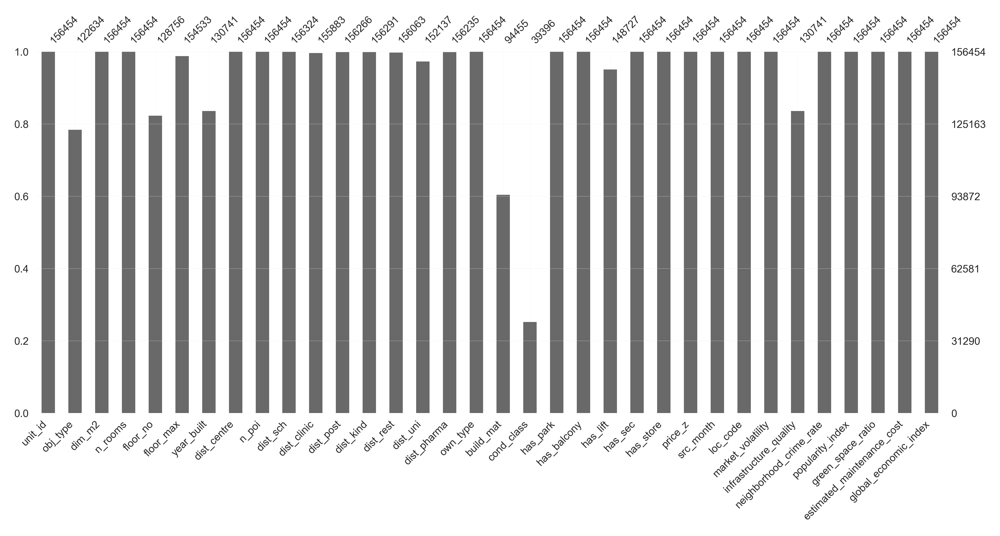

In [11]:
msno.bar(train)

The bar chart above gives a quick graphical overview of the completeness of the dataset. We can see what variables  have missing values. The bar chart provides a quick overview of variable completeness. The most affected variables are: cond_class (74.82%), build_mat (39.63%), obj_type (21.62%), floor_no (17.70%), year_built (16.43%), infrastructure_quality (16.43%). Other variables have minimal missingness (<5%).

<Axes: >

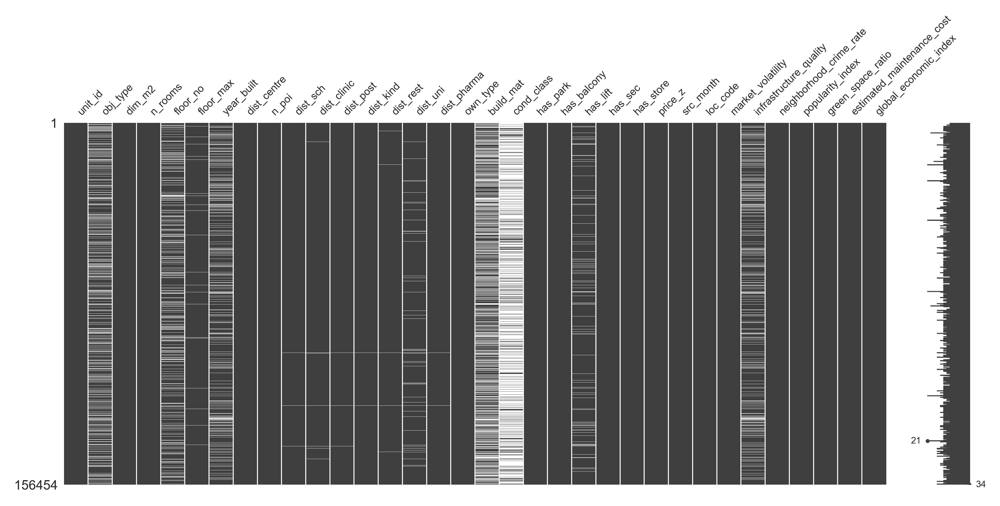

In [12]:
msno.matrix(train)

The white gaps in the missingness matrix allow us to detect the following spatial patterns in missingness across rows:

- Several distance-related features (dist_sch, dist_clinic, dist_post, dist_kind, dist_rest, dist_pharma) show similar missingness patterns for the same records — hinting at shared measurement failure or area-level data gaps.

- Columns like build_mat or obj_type have widespread but less structured missingness, which may indicate MAR. 

The sparkline on the right gives an idea of the general shape of the completeness of the data and points out the row  with the minimum nullities and the total number of columns in a given dataset, at the bottom.

<Axes: >

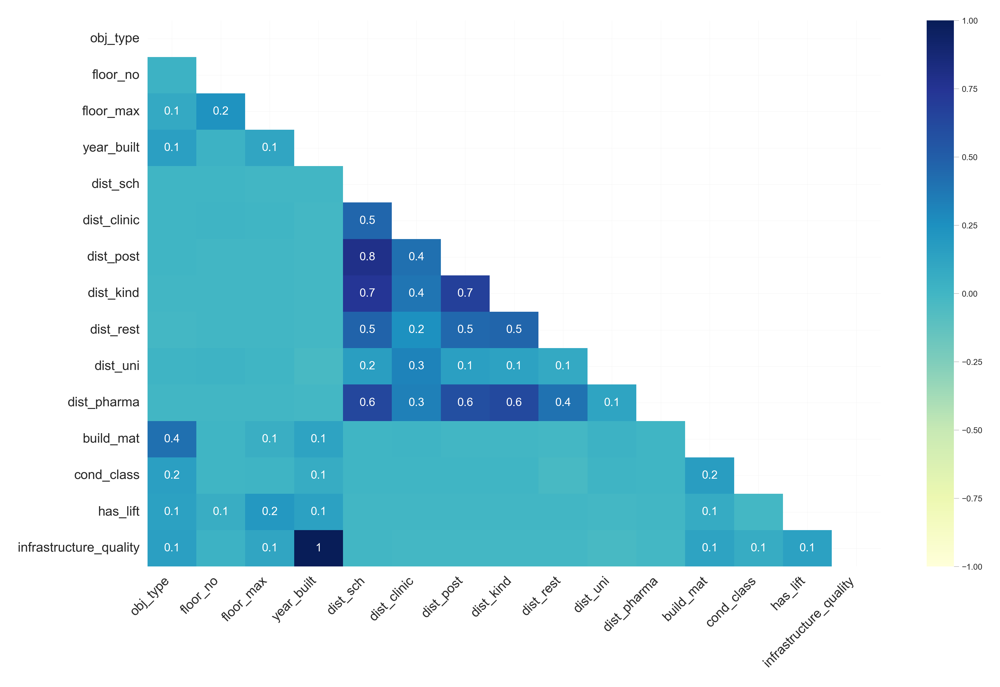

In [13]:
msno.heatmap(train, cmap="YlGnBu")

The heatmap of pairwise missingness correlation shows that there are strong correlations between missing values of different features. Firstly, we can see that year_built is highly (particularly perfectly) correlated with infrastrucutre_quality. Secondly, additionally to the visual inspection, we can see moderate-to-high missingness correlation between distance variables. Finally, we also can observe moderate correlation between obj_type and built_mat suggesting that the missingness of one may inform the other, like certain object types may lack information on building material. 

<Axes: >

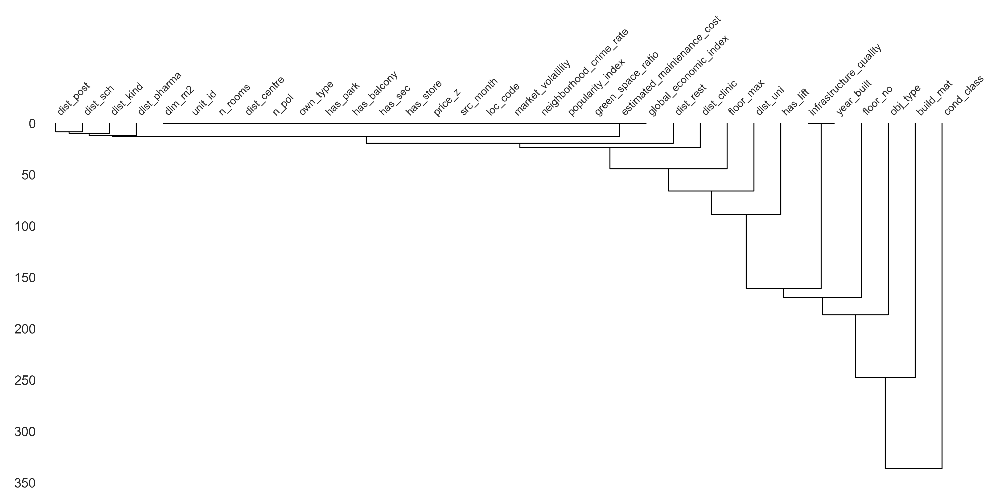

In [14]:
msno.dendrogram(train)

The dendrogram clusters variables based on the similarity of their missingness profiles. This further confirms that distance features cluster together,therefore, potentially allowing joint imputation or modeling of shared missingness. year_built and infrastructure_quality are grouped that reaffirming redundancy. obj_type, build_mat, and cond_class may share a common source of missingness related to the same block of metadata being unavailable.

##### cond_class and build_mat

Despite the fact, that correlation between cond_class, build_mat and obj_type is very weak, we want to check whether some patterns exist between variables. Use contingency tables to test.  

In [15]:
# cond_class & build_mat
pd.crosstab(train['cond_class'], train['build_mat'], normalize='index')

build_mat,7ceffe3b,7f8c00f9
cond_class,,
53cced8d,0.61,0.39
a2881958,0.84,0.16


In [16]:
# cond_class & obj_type
pd.crosstab(train['cond_class'], train['obj_type'], normalize='index')

obj_type,0c238f18,0d6c4dfc,2a6d5c01
cond_class,,,
53cced8d,0.24,0.72,0.04
a2881958,0.17,0.49,0.34


In [17]:
pd.crosstab(train['obj_type'], train['build_mat'], normalize='index')   

build_mat,7ceffe3b,7f8c00f9
obj_type,,
0c238f18,1.00,0.00
0d6c4dfc,0.50,0.50
2a6d5c01,0.99,0.01


Using conditional frequency tables, we discovered strong patterns linking build_mat to both obj_type and cond_class. For instance, apartments with obj_type = 0c238f18 or 2a6d5c01 used the material 7ceffe3b in nearly 100% of cases. Similarly, cond_class = a2881958 also implied an 84% likelihood of the same material. Based on this, we adopted a rule-based imputation strategy, filling build_mat using group-wise dominant categories. 

In [18]:
# Impute build_mat column based on obj_type and cond_class values
def impute_build_mat(row):
    if pd.notna(row['build_mat']):
        return row['build_mat']
    elif row['obj_type'] in ['0c238f18', '2a6d5c01']:
        return '7ceffe3b'
    elif row['cond_class'] == 'a2881958':
        return '7ceffe3b'
    elif row['cond_class'] == '53cced8d':
        return '7ceffe3b'
    else:
        return np.nan

train['build_mat'] = train.apply(impute_build_mat, axis=1)        

In [19]:
# Impute cond_class column based on build_mat values
def impute_cond_class(row):
    if pd.notna(row['cond_class']):
        return row['cond_class']
    elif row['build_mat'] in ['7ceffe3b']:
        return 'a2881958'
    else:
        return np.nan

train['cond_class'] = train.apply(impute_cond_class, axis=1)

In [20]:
num_missing = train.isna().sum()
num_missing = num_missing[num_missing > 0]
percent_missing = num_missing * 100 / train.shape[0]
pd.concat([num_missing, percent_missing], axis=1, 
          keys=['Missing Values', 'Percentage']).\
          sort_values(by="Missing Values", ascending=False)

,Missing Values,Percentage
cond_class,65541,41.89
build_mat,51932,33.19
obj_type,33820,21.62
floor_no,27698,17.70
year_built,25713,16.43
infrastructure_quality,25713,16.43
has_lift,7727,4.94
dist_uni,4317,2.76
floor_max,1921,1.23
dist_clinic,571,0.36


We see now that we reduces number of missing values for cond_class by 30 pp, and build_mat by 6 pp.
For remaining missing values in cond_class and build_mat, we filled them using the most frequent value withing build_mat and obj_type respectively. 

After applying rule-based and group-wise imputation strategies for build_mat and cond_class, we applied global mode imputation as a final step. This is valid strategy for string values https://scikit-learn.org/stable/modules/generated/sklearn.impute.SimpleImputer.html. 

In [ ]:
# Impute build_mat
build_mat_by_obj = train.groupby('obj_type')['build_mat'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else np.nan)

train['build_mat'] = train.apply(
    lambda row: build_mat_by_obj[row['obj_type']] if pd.isna(row['build_mat']) and row['obj_type'] in build_mat_by_obj else row['build_mat'],
    axis=1)

In [ ]:
# Impute cond_class
cond_class_by_build = train.groupby('build_mat')['cond_class'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else np.nan)

train['cond_class'] = train.apply(
    lambda row: cond_class_by_build[row['build_mat']] if pd.isna(row['cond_class']) and row['build_mat'] in cond_class_by_build else row['cond_class'],
    axis=1)

In [23]:
# Fill in build_mat column with mode value by build_mat column
train['build_mat'] = train['build_mat'].fillna(train['build_mat'].mode()[0])

# Fill in cond_class column with mode value by cond_class column
train['cond_class'] = train['cond_class'].fillna(train['cond_class'].mode()[0])

In [24]:
# Check missing values again
num_missing = train.isna().sum()
num_missing = num_missing[num_missing > 0]
percent_missing = num_missing * 100 / train.shape[0]
pd.concat([num_missing, percent_missing], axis=1, 
          keys=['Missing Values', 'Percentage']).\
          sort_values(by="Missing Values", ascending=False)

,Missing Values,Percentage
obj_type,33820,21.62
floor_no,27698,17.70
year_built,25713,16.43
infrastructure_quality,25713,16.43
has_lift,7727,4.94
dist_uni,4317,2.76
floor_max,1921,1.23
dist_clinic,571,0.36
dist_rest,391,0.25
dist_pharma,219,0.14


##### obj_type

Fill missing values based on correlated variables build_mat and cond_class. However, we need to be aware about these variables further, and test collinearity, while implementing several models (Linear regression, Ridge, SVM with kernel) if we select them. 

In [25]:
# cond_class & obj_type
pd.crosstab(train['cond_class'], train['obj_type'], normalize='index')

obj_type,0c238f18,0d6c4dfc,2a6d5c01
cond_class,,,
53cced8d,0.13,0.84,0.03
a2881958,0.21,0.53,0.26


In [26]:
# build_mat & obj_type
pd.crosstab(train['build_mat'], train['obj_type'], normalize='index')

obj_type,0c238f18,0d6c4dfc,2a6d5c01
build_mat,,,
7ceffe3b,0.23,0.52,0.25
7f8c00f9,0.00,0.99,0.01


In [ ]:
# Impute obj_type
def impute_obj_type(row): 
    if pd.notna(row['obj_type']):
        return row['obj_type']
    elif row['cond_class'] in ['53cced8d', 'a2881958']:
        return '0d6c4dfc' 
    elif row['build_mat'] in ['7ceffe3b', '7f8c00f9']:
        return '0d6c4dfc'
    else: 
        return np.nan

train['obj_type'] = train.apply(impute_obj_type, axis=1) 

In [28]:
# Check missing values again
num_missing = train.isna().sum()
num_missing = num_missing[num_missing > 0]
percent_missing = num_missing * 100 / train.shape[0]
pd.concat([num_missing, percent_missing], axis=1, 
          keys=['Missing Values', 'Percentage']).\
          sort_values(by="Missing Values", ascending=False)

,Missing Values,Percentage
floor_no,27698,17.70
year_built,25713,16.43
infrastructure_quality,25713,16.43
has_lift,7727,4.94
dist_uni,4317,2.76
floor_max,1921,1.23
dist_clinic,571,0.36
dist_rest,391,0.25
dist_pharma,219,0.14
dist_post,188,0.12


That was enough to fill missed values for obj_type. 

##### floor_no

We can consider to put median to fill missing values. However, we want to check whether there is any pattern between type of object and floor number. 

In [29]:
pd.crosstab(train['floor_no'], train['obj_type'], normalize='index')

obj_type,0c238f18,0d6c4dfc,2a6d5c01
floor_no,,,
1.00,0.17,0.64,0.18
2.00,0.19,0.65,0.16
3.00,0.17,0.69,0.14
4.00,0.14,0.72,0.15
5.00,0.09,0.67,0.24
6.00,0.03,0.73,0.24
7.00,0.01,0.77,0.22
8.00,0.00,0.87,0.12
9.00,0.00,0.89,0.11


From the table above we can see, that for the object type 0c238f18 likely floors could be from 1 to 7. For the 0d6c4dfc and 2a6d5c01 object type the floors spread differently and we couldn't notice any obvious pattern. However, we can use this rules to compute median for the missing values. 

In [ ]:
# Impute floor_no with median by obj_type grouped values 
median_floor_by_obj = train.groupby('obj_type')['floor_no'].median()

train['floor_no'] = train.apply(
    lambda row: median_floor_by_obj[row['obj_type']] if pd.isna(row['floor_no']) and row['obj_type'] in median_floor_by_obj else row['floor_no'],
    axis=1)

##### year_build and ifrastructure_quality

We can notice, that for the year_build and ifrastructure_quality variables the same number of missing values. Although infrastructure_quality showed moderate correlation with other variables (refer to  n_poi), its definition suggested that it is a post-processed function of construction year. Therefore, we first imputed year_built, then derived infrastructure quality accordingly to maintain consistency.

To impute year_built, let's refer to the contingency table again and use built_mat as a second variable. Sounds logical, that there is relation between the materials for buildings and the construction year. Then use median by grouped building materials to impute year. 

In [31]:
pd.crosstab(train['year_built'], train['build_mat'], normalize='index')

build_mat,7ceffe3b,7f8c00f9
year_built,,
1850.00,1.00,0.00
1851.00,1.00,0.00
1852.00,1.00,0.00
1854.00,1.00,0.00
1855.00,1.00,0.00
...,...,...
2020.00,0.99,0.01
2021.00,0.99,0.01
2022.00,0.99,0.01


In [ ]:
# Impute year_built with median by build_mat grouped values 
median_year_by_mat = train.groupby(['build_mat'])['year_built'].median()

train['year_built'] = train.apply(
    lambda row: median_year_by_mat[row['build_mat']]
    if pd.isna(row['year_built']) and pd.notna(row['build_mat']) and row['build_mat'] in median_year_by_mat
    else row['year_built'],
    axis=1)

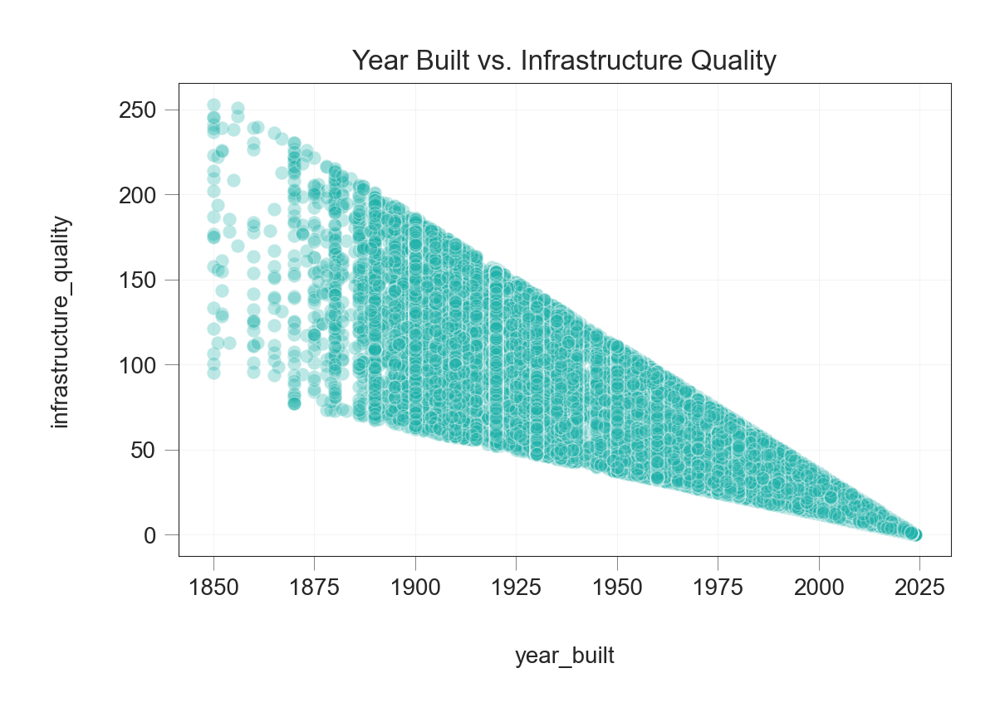

In [33]:
sns.scatterplot(data=train, x='year_built', y='infrastructure_quality', alpha=0.3, color = 'lightseagreen')
plt.title('Year Built vs. Infrastructure Quality')
plt.show()

From the plot above and the Pearson correlation matrix, we observe a strong inverse relationship between year_built and infrastructure_quality. This suggests that a first-order approximation, where infrastructure quality decreases with building age, is reasonable. However, we must acknowledge that the infrastructure_quality variable could be normalized, derived with noise, or influenced by other latent features.

We don't want to hardcore infrastructure_quality variable. Specifically, we model the relationship empirically using complete observations, as suggested by: https://scikit-learn.org/stable/modules/impute.html#iterative-imputer and V.Buuren "Flexible Imputation of Missing data", Chapter 4 https://stefvanbuuren.name/fimd/sec-FCS.html.

In [34]:
# Create linear regression model. Dependent var - infrastructure_quality without missing values. 
ifrastructure_quality__data = train[train['infrastructure_quality'].notna()]

X = ifrastructure_quality__data[['year_built']]  
y = ifrastructure_quality__data['infrastructure_quality']

model = LinearRegression()
model.fit(X, y)

LinearRegression()

In [35]:
print("R^2 score:", model.score(X, y))

R^2 score: 0.8429827537694239


In [36]:
# Predict missing values for infrastructure_quality
missing_infr_quality = train['infrastructure_quality'].isna()
train.loc[missing_infr_quality, 'infrastructure_quality'] = model.predict(train.loc[missing_infr_quality, ['year_built']])

We fit a linear regression model using year_built as the primary predictor of infrastructure_quality, trained on non-missing data. The model achieved an R^2 score of 0.844, indicating that approximately 84% of the variance in infrastructure quality can be explained by the construction year. This high explanatory power supports the validity of our approach. We then used this model to impute missing values in infrastructure_quality, preserving the empirical structure of the dataset without using wrong assumptions.

#### floor_max

The first we decided to compute floor_max variable to fill in then has_lift value. So, the maximum floor could depend on the type of the building (obj_type) and the floor_no. Lets's check obj_type.

In [37]:
pd.crosstab(train['floor_max'], train['obj_type'], normalize='index')

obj_type,0c238f18,0d6c4dfc,2a6d5c01
floor_max,,,
1.00,0.21,0.70,0.10
2.00,0.26,0.57,0.17
3.00,0.25,0.63,0.12
4.00,0.18,0.72,0.10
5.00,0.16,0.55,0.29
6.00,0.07,0.55,0.38
7.00,0.03,0.58,0.39
8.00,0.02,0.65,0.33
9.00,0.00,0.76,0.24


Yes, we see some patterns based on obj_type. Lets group it with floor_no as well, to avoid confusions and use median to fill in data.

In [38]:
floor_type_group = train.groupby(['floor_no', 'obj_type'])['floor_max'].median()
type_group = train.groupby('obj_type')['floor_max'].median()

In [39]:
# Impute floor_max variable
def impute_floor_max(row):
    if pd.notna(row['floor_max']):
        return row['floor_max']
    elif pd.notna(row['floor_no']) and pd.notna(row['obj_type']):
        key = (row['floor_no'], row['obj_type'])
        if key in floor_type_group:
            return max(floor_type_group[key], row['floor_no'])  # floor_max must be ≥ floor_no

    return type_group.get(row['obj_type'], train['floor_max'].median())

train['floor_max'] = train.apply(impute_floor_max, axis=1)

In [40]:
# Check that floor_no of apartment <= floor_max
invalid_floors  = train[train['floor_no'] > train['floor_max']]

if not invalid_floors.empty:
    print("Incorrect floors exist:")
    display(invalid_floors[['floor_no', 'floor_max']].head())
else:
    print("Max floors filled correctly")   

Incorrect floors exist:


,floor_no,floor_max
106,3.00,2.00
194,3.00,1.00
208,3.00,2.00
304,3.00,2.00
439,3.00,2.00


In [41]:
# Fix the inconsistence and check again 

train.loc[train['floor_no'] > train['floor_max'], 'floor_max'] = train['floor_no'] + 1 # apply an rough adjustment, that it would be floor_no + 1 = floor_max

invalid_floors  = train[train['floor_no'] > train['floor_max']]

if not invalid_floors.empty:
    print("Incorrect floors exist:")
    display(invalid_floors[['floor_no', 'floor_max']].head())
else:
    print("Max floors filled correctly") 


Max floors filled correctly


##### has_lift

Check the most frequent values of the elevator and the relarionship with maximum floor in the building. Usually, building with higher floor has lift.  

In [42]:
print(train['has_lift'].value_counts())

has_lift
no     74680
yes    74047
Name: count, dtype: int64


In [43]:
pd.crosstab(train['floor_max'], train['has_lift'], normalize='index')

has_lift,no,yes
floor_max,,
1.00,0.84,0.16
2.00,0.84,0.16
3.00,0.77,0.23
4.00,0.75,0.25
5.00,0.24,0.76
6.00,0.08,0.92
7.00,0.08,0.92
8.00,0.09,0.91
9.00,0.07,0.93


As we assumed, the probability of having lift fises, when building has more than 5 floors. However, we can notice that the difference between having lift in the building is not so big. Let's also check distribution of the building by max floor. 

(array([41417., 77894., 12244., 19913.,  1239.,  2896.,   358.,   208.,
          179.,   106.]),
 array([ 1. ,  3.8,  6.6,  9.4, 12.2, 15. , 17.8, 20.6, 23.4, 26.2, 29. ]),
 <BarContainer object of 10 artists>)

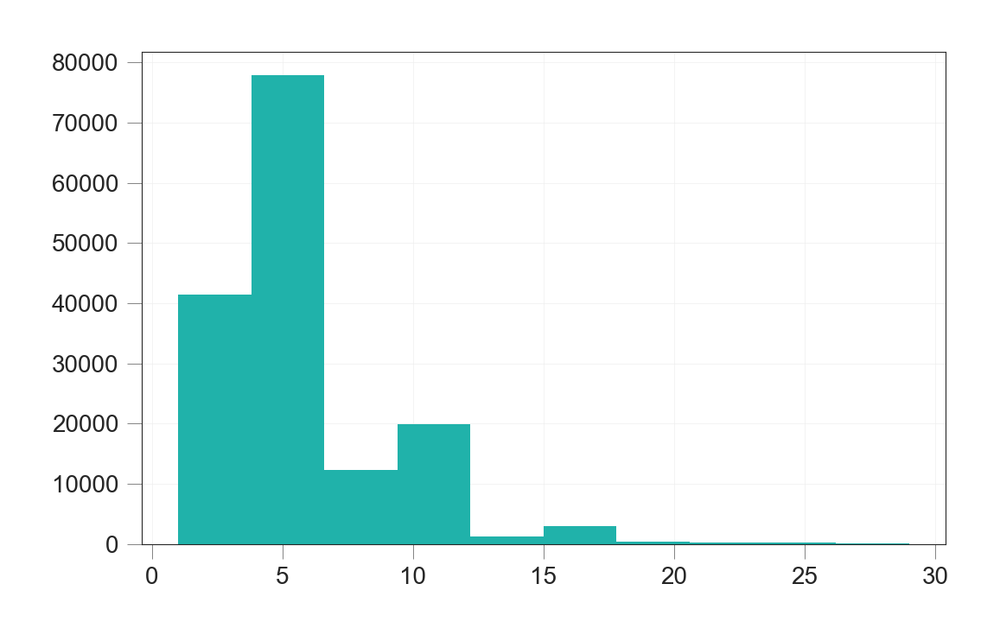

In [44]:
plt.hist(train['floor_max'], color='lightseagreen', edgecolor='black')

To impute missing values in the binary has_lift variable, we leveraged the structural relationship between building height (that is floor_max) and the presence of elevators. Crosstab analysis showed that buildings with 5 or more floors had lifts in over 75% of cases, rising to nearly 100% in taller buildings. Based on this clear monotonic trend, we imputed has_lift = 'yes' for missing values where floor_max ≥ 5, and no otherwise. 

In [45]:
# Impute has_lift variable
def impute_has_lift(row):
    if pd.notna(row['has_lift']):
        return row['has_lift']
    elif pd.notna(row['floor_max']):
        return 'yes' if row['floor_max'] >= 5 else 'no'
    else:
        return np.nan
    
train['has_lift'] = train.apply(impute_has_lift, axis=1)   

##### distances 

Distances to nearby services such as clinics, schools, and restaurants exhibited very low rates of missingness (under 3%). To impute missing values, we could use location code (loc_code), assuming that anonamized location code of the apartmens means location/district of the apartment and nearby apartments share similar spatial features. As an example, let's take distance to university. 

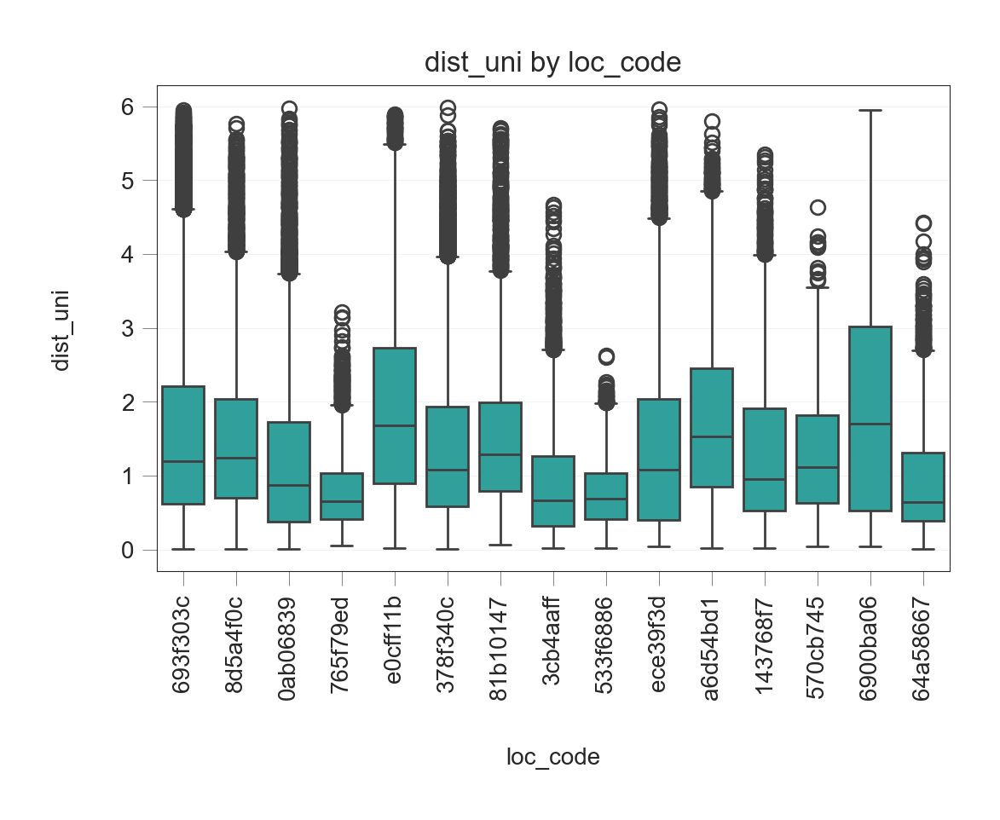

In [46]:
sns.boxplot(data=train, x='loc_code', y='dist_uni', color = 'lightseagreen')
plt.xticks(rotation=90)
plt.title("dist_uni by loc_code")
plt.show()

Distance-related variables (dist to universities, clinics, pharmacy, post offices, kindergarden, ect) showed clear geographic patterns based on loc_code, as visualized by boxplots. We therefore imputed missing values using the median of each distance variable within the corresponding loc_code group. This approach respects spatial variation and preserves local neighborhood structure. For rare cases without valid loc_code information, we used the global median as a fallback.

In [47]:
# Impute distances grouped by local code with median
group_medians = train.groupby('loc_code')[
    ['dist_uni', 'dist_clinic', 'dist_rest', 'dist_pharma', 
     'dist_post', 'dist_kind', 'dist_sch']
].median()
print (group_medians)

for col in ['dist_uni', 'dist_clinic', 'dist_rest', 'dist_pharma', 
            'dist_post', 'dist_kind', 'dist_sch']:
    
    train[col] = train.apply(
        lambda row: group_medians.loc[row['loc_code'], col] 
        if pd.isna(row[col]) and row['loc_code'] in group_medians.index 
        else row[col], axis=1
    )
    
    train[col] = train[col].fillna(train[col].median())

                     dist_uni          dist_clinic            dist_rest  \
loc_code                                                                  
0ab06839                 0.87                 0.90                 0.29   
143768f7                 0.95                 0.63                 0.20   
378f340c                 1.08                 0.63                 0.20   
3cb4aaff                 0.66                 1.10                 0.25   
533f6886                 0.69                 0.54                 0.20   
570cb745                 1.11                 0.45                 0.22   
64a58667                 0.64                 1.12                 0.31   
6900ba06                 1.71                 2.35                 0.56   
693f303c                 1.19                 0.53                 0.18   
765f79ed                 0.65                 0.36                 0.22   
81b10147                 1.28                 0.87                 0.36   
8d5a4f0c                 

In [48]:
# Check missing values again
num_missing = train.isna().sum()
num_missing = num_missing[num_missing > 0]
percent_missing = num_missing * 100 / train.shape[0]
pd.concat([num_missing, percent_missing], axis=1, 
          keys=['Missing Values', 'Percentage']).\
          sort_values(by="Missing Values", ascending=False)

,Missing Values,Percentage


In [49]:
#Converting categorical columns to binary
columns_to_change = ['has_park', 'has_balcony', 'has_lift','has_sec','has_store']
maping = {'yes': 1, 'no': 0}

train[columns_to_change] = train[columns_to_change].applymap(lambda x: maping.get(x, x))

In [50]:
#Converting year_built to int and src_month to date 

train['year_built'] = train['year_built'].astype('Int64')

train['src_month'] = pd.to_datetime(train['src_month'], format='%Y-%m')

### EDA
In this section, we will explore the data using visualizations. This will allow us to understand the data and the relationships between variables better, which will help us build a better model. Start with convering some of them to the appropriate data type. 

In [51]:
train.dtypes

unit_id                               object
obj_type                              object
dim_m2                               float64
n_rooms                              float64
floor_no                             float64
floor_max                            float64
year_built                             Int64
dist_centre                          float64
n_poi                                float64
dist_sch                             float64
dist_clinic                          float64
dist_post                            float64
dist_kind                            float64
dist_rest                            float64
dist_uni                             float64
dist_pharma                          float64
own_type                              object
build_mat                             object
cond_class                            object
has_park                               int64
has_balcony                            int64
has_lift                               int64
has_sec   

##### Target variable

Our dataset contains a lot of variables, but the most important one for us to explore is the target variable. We need to understand its distribution. First, we start by plotting the histogram and boxplot plot for the target variable.

Text(0, 0.5, 'count')

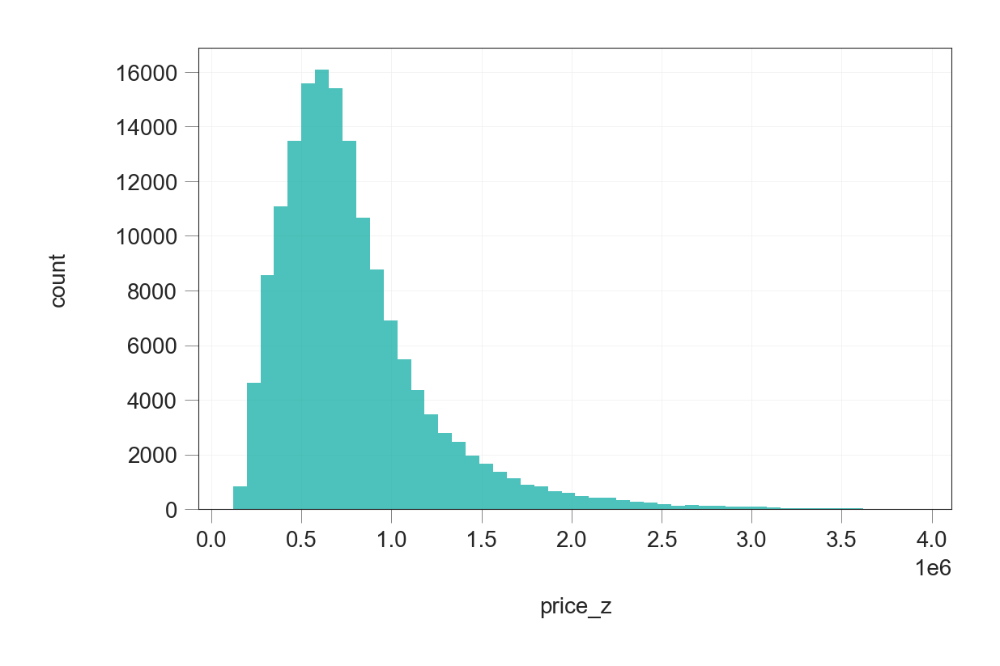

In [52]:
sns.distplot(train['price_z'], kde=False, 
             color='lightseagreen', hist_kws={"alpha": 0.8})
plt.ylabel("count")

The histogram above shows that apartment prices are right-skewed and unimodal, with the majority of prices concentrated between 250,000 and 2,000,000. The distribution peaks between 500,000 and 1,000,000, indicating this is the most common price range among listings. Relatively few properties exceed 2,000,000, suggesting high-end apartments are less frequent or less in demand. The right skew reflects the presence of a long tail of high-priced apartments, which are rare but significantly affect the distribution's shape.

<Axes: xlabel='price_z'>

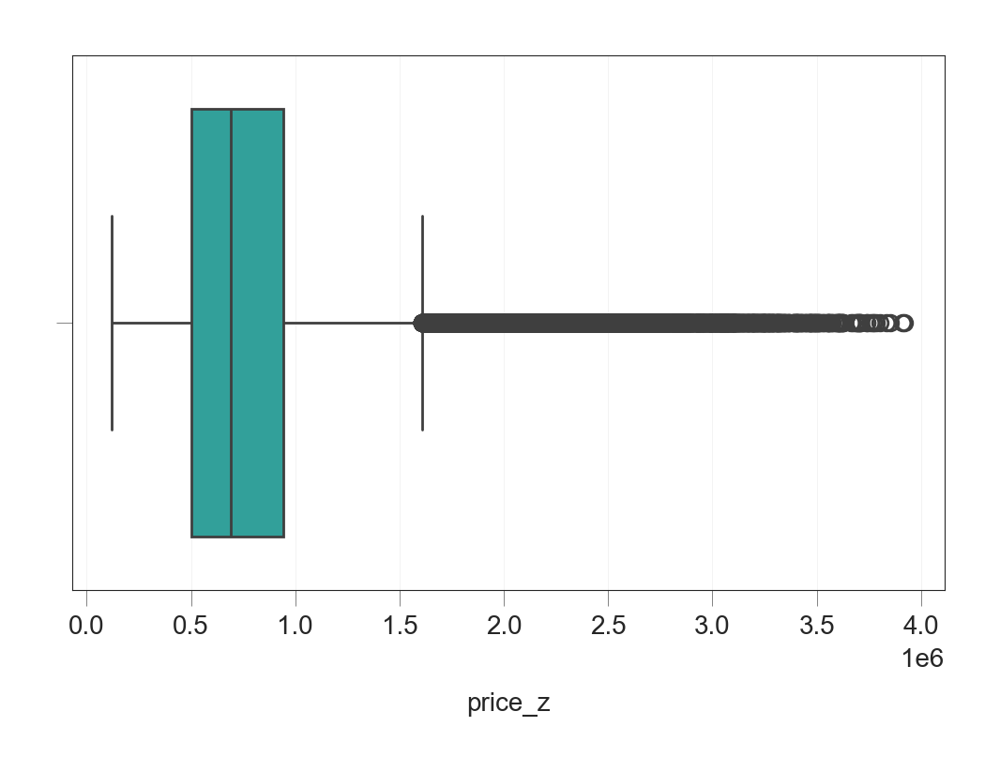

In [53]:
sns.boxplot(x=train['price_z'], color = 'lightseagreen')

The boxplot displays the distribution of apartment prices, highlighting the interquartile range (IQR) — the middle 50% of prices — which falls between approximately 500,000 and 1,000,000. The vertical line within the box represents the median price, while the whiskers extend to the typical minimum and maximum values, excluding outliers. Notably, a substantial number of apartments are flagged as outliers beyond 1,500,000, indicating the presence of high-end properties that are less common but significantly inflate the upper tail of the distribution.

##### Correlation between variables

From the matrix output we can see Pearson correlation coefficients, linear relationship between variables. The target variable price_z shows strong positive correlations with apartment size (dim_m2, 0.56), number of rooms (n_rooms, 0.47), estimated maintenance cost (0.39), and especially with market volatility (0.97), indicating that price is strongly driven by both physical characteristics and market conditions.

Moderate positive correlations are observed with building year (year_built, 0.10), number of nearby points of interest (n_poi, 0.18), and boolean features like has_park (0.14), has_lift (0.20), and has_sec (0.13). These correlations are quite intuitive: while these factors may not be the primary drivers of apartment prices, they do contribute positively. For example, apartments located in areas with a greater number of nearby amenities or safety features may be perceived as more desirable and thus command higher prices.

On the other hand, price is negatively correlated with distance variables such as dist_clinic (-0.10) and dist_rest (-0.10), as well as the presence of a storage room (has_store, -0.16).  These results also make sense: proximity to essential services, like clinics, can enhance convenience and perceived quality of life — factors that buyers are willing to pay for. A shorter distance to such facilities may therefore be associated with higher property prices. 

Other features exhibit only weak correlations with price_z, suggesting limited direct influence on apartment pricing.

In [54]:
train.corr(numeric_only = True)['market_volatility'].sort_values(ascending=False)

market_volatility                            1.00
price_z                                      0.97
dim_m2                                       0.55
n_rooms                                      0.46
estimated_maintenance_cost                   0.38
has_lift                                     0.19
n_poi                                        0.17
has_park                                     0.13
has_sec                                      0.13
year_built                                   0.10
dist_centre                                  0.08
has_balcony                                  0.07
floor_max                                    0.03
floor_no                                     0.02
global_economic_index                        0.00
popularity_index                             0.00
dist_sch                                     0.00
neighborhood_crime_rate                     -0.00
dist_post                                   -0.01
dist_pharma                                 -0.01


<Axes: >

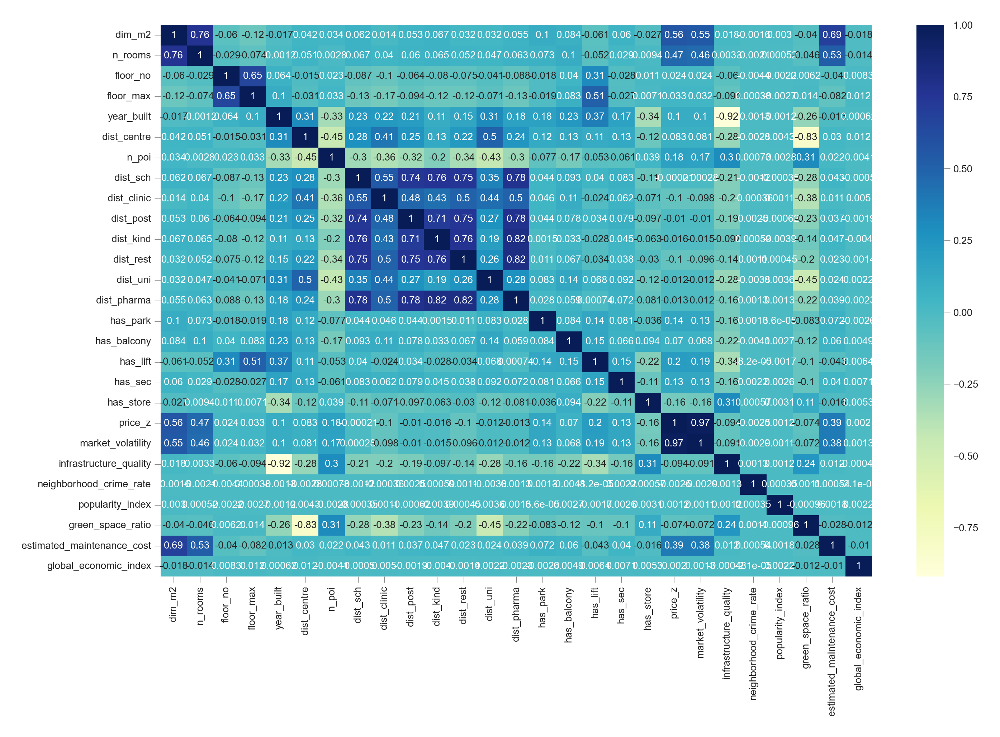

In [55]:
plt.figure(figsize=(16,10))
sns.heatmap(train.corr(numeric_only = True), cmap='YlGnBu', annot=True)

##### High positive correlation

Firstly, we want to visualize the relationships between the target variable and the variables that are highly and positively correlated with it, according to what we saw in the heatmap. Namely, these variables are: dim_m2, n_rooms, estimated_maintenance_cost and market_volatility. Let's start with distribution of the variables. 

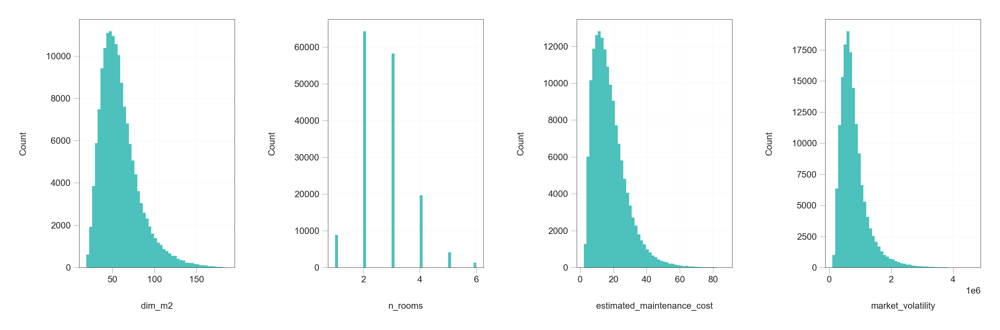

In [56]:
fig, axes = plt.subplots(1, 4, figsize=(18,5))
fig.subplots_adjust(hspace=0.5, wspace=0.6)
for ax, v in zip(axes.flat, ['dim_m2', 'n_rooms', 
                             'estimated_maintenance_cost', 'market_volatility']):
    sns.distplot(train[v], kde=False, color='lightseagreen', 
                 hist_kws={'alpha': 0.8}, ax=ax)
    ax.set(ylabel="Count");

The first histogram illustrates the distribution of apartment sizes in square meters. Most apartments fall between 25 and 100 square meters, suggesting that mid-sized units dominate the market. There are relatively few larger apartments above 100 square meters, indicating that spacious units are less common or less in demand. The distribution is right-skewed, with a long tail of larger properties that, although rare, significantly influence the overall distribution.

The second histogram shows that the number of rooms in apartments ranges from 1 to 6. The majority of apartments have 2 or 3 rooms, indicating these are the most common and likely the most in-demand configurations. Apartments with 5 or 6 rooms are relatively rare, suggesting that larger apartments are less commonly available or less frequently chosen by buyers.

The range of the estimated maintenance cost is relatively low, compared to the apartment prices: min value is 2.06 and max values is 87.20. This suggests that the maintenance cost variable likely reflects a recurring cost, such as monthly or annual charges, rather than a one-time fee. Alternatively, it could represent a cost per square meter, as it's strongly correlated with apartment size (dim_m2), and possibly influenced by other features such as location, building quality, or nearby points of interest which also impact the apartment's market price. 

The third histogram illustrates the distribution of estimated maintenance costs for apartments. The majority of apartments have relatively low maintenance costs, with most values concentrated between 5 and 25 units. The right-skewed distribution reflects the presence of larger apartments with higher service needs but lower frequency.

The fourth histogram shows that market_volatility values are right-skewed, with most data concentrated between 500,000 and 1,500,000. While fewer apartments fall into higher-volatility ranges, these still significantly influence the distribution's tail.

Overall, we can see the same pattern across these variables: variables are have right-skewed distribution with a long-tails, indicating outliers.

Now let's draw scatterplots for these variables. 

Text(0, 0.5, 'Price')

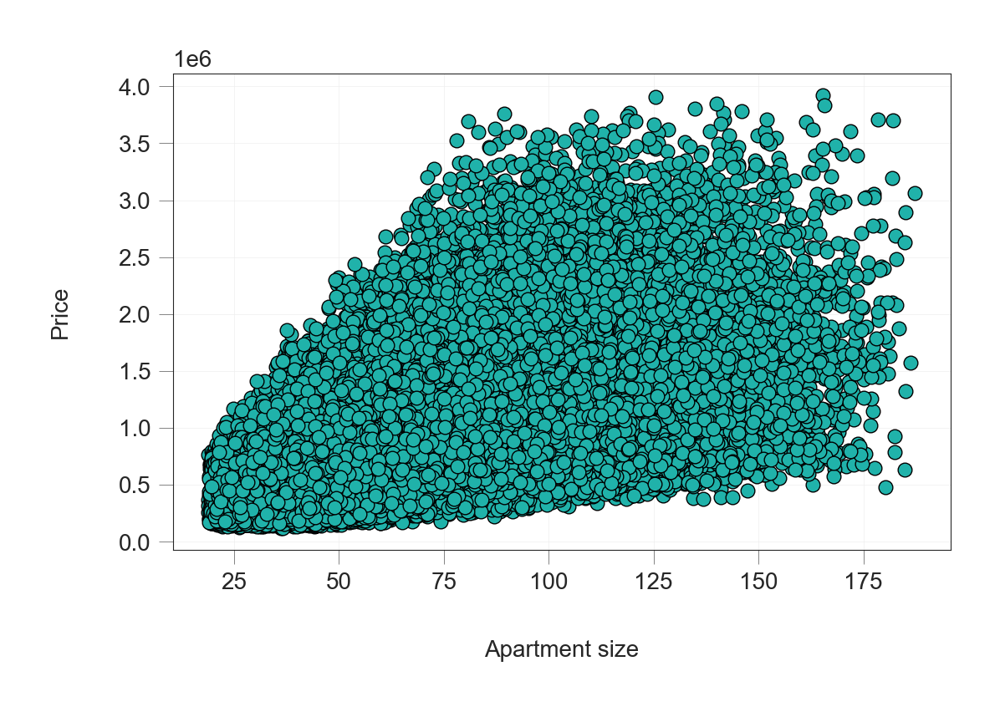

In [57]:
plt.scatter(x=train['dim_m2'], y=train['price_z'], 
            color='lightseagreen', edgecolors='#000000', linewidths=0.5)
plt.xlabel("Apartment size") 
plt.ylabel("Price")

The scatter plot further confirms a positive relationship between apartment size and price. Larger apartments tend to be more expensive, as expected. However, the relationship is not perfectly linear. While price generally increases with size, the spread of points shows increasing variability, possibly reflecting the influence of other factors such as location, condition, or nearby points of interest.

Lets's now turn to the number of rooms (n_rooms) variable. 

Text(0, 0.5, 'Price')

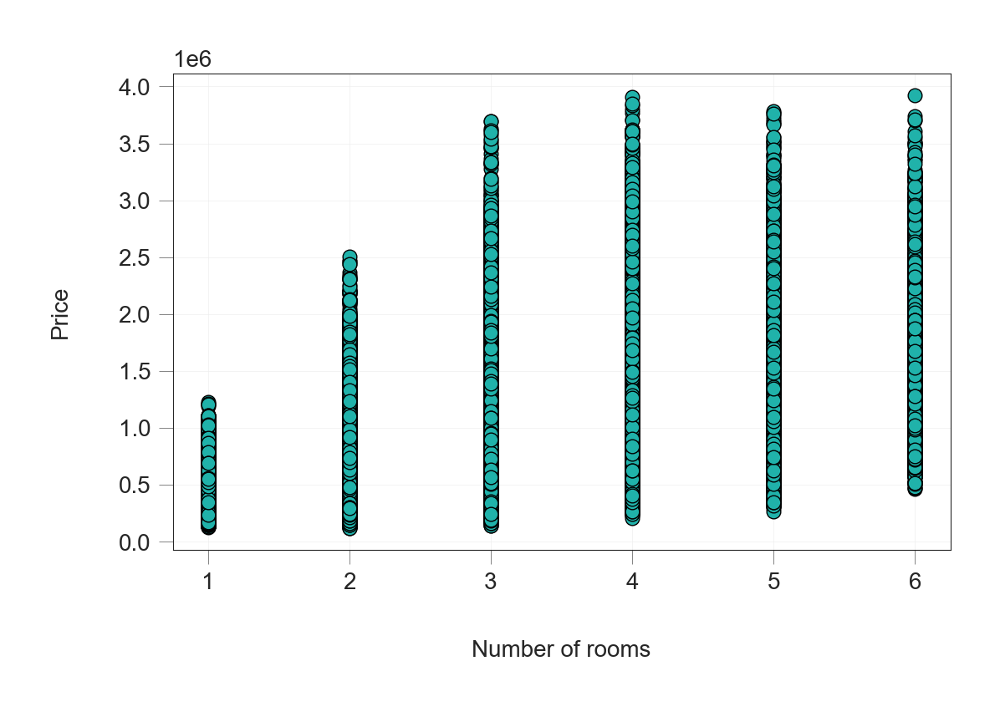

In [58]:
plt.scatter(x=train['n_rooms'], y=train['price_z'], 
            color='lightseagreen', edgecolors='#000000', linewidths=0.5)
plt.xlabel("Number of rooms") 
plt.ylabel("Price")

The scatterplot illustrates the relationship between apartment price and the number of rooms. There is a positive trend: as the number of rooms increases, the upper range of apartment prices also tends to increase. However, within each room count category, prices vary significantly, indicating that other factors—such as apartment size, location, ect. also play a substantial role in determining the price. For example, some 2-room apartments are priced higher than 4-room apartments, highlighting that room count alone doesn't fully explain the variation in price.

Text(0, 0.5, 'Price')

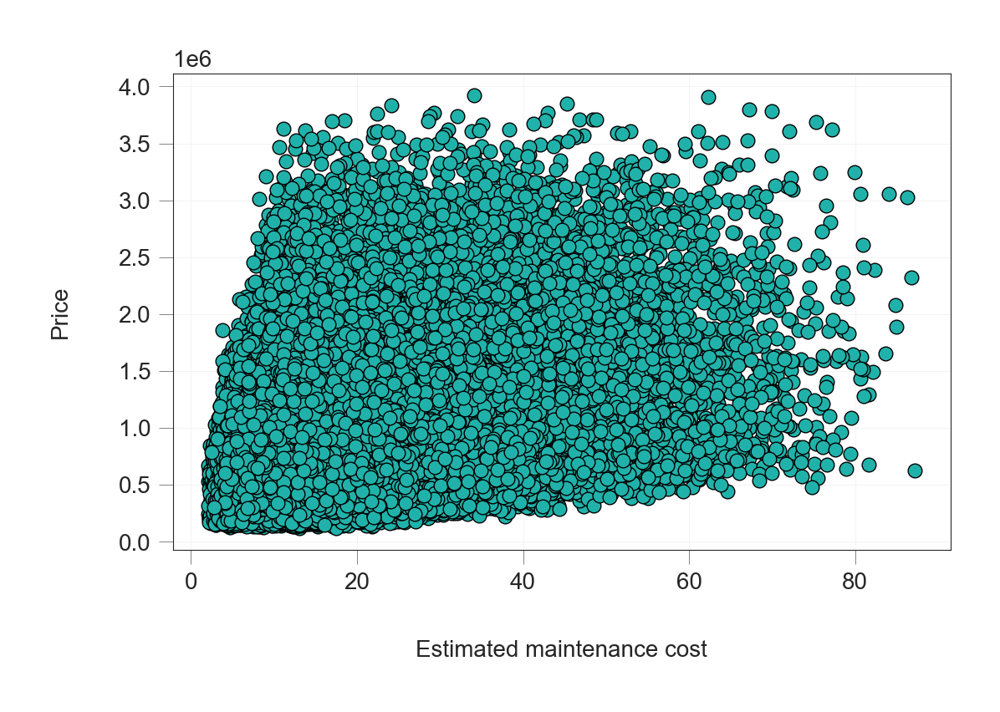

In [59]:
plt.scatter(x=train['estimated_maintenance_cost'], y=train['price_z'], 
            color='lightseagreen', edgecolors='#000000', linewidths=0.5)
plt.xlabel("Estimated maintenance cost") 
plt.ylabel("Price")

The scatter plot shows a positive relationship between estimated maintenance cost and apartment price. As expected, more expensive apartments tend to have higher maintenance costs. However, the relationship appears nonlinear and with increasing variance—the spread of prices becomes wider as maintenance cost increases. This could suggest that while maintenance cost is an important predictor of price, other factors (like location, size, or amenities) also significantly influence apartment pricing.

Now let's move to the market_volatility variable. 

Text(0, 0.5, 'Price')

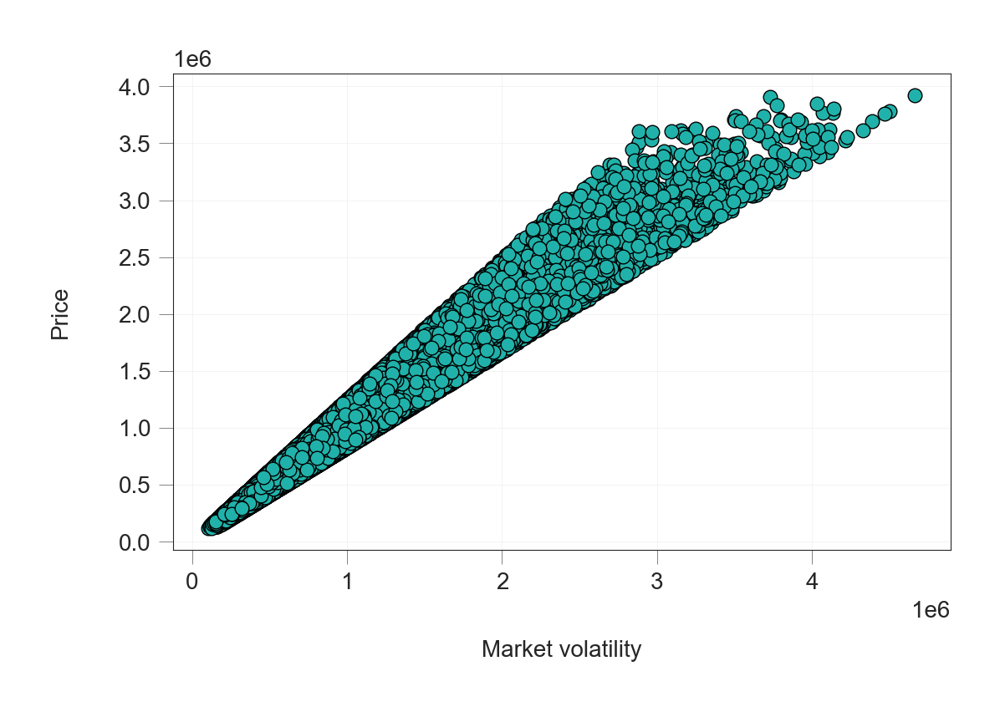

In [60]:
plt.scatter(x=train['market_volatility'], y=train['price_z'], 
            color='lightseagreen', edgecolors='#000000', linewidths=0.5)
plt.xlabel("Market volatility") 
plt.ylabel("Price")

The scatterplot illustrates a strong linear relationship between market_volatility and price. This makes sense, as market_volatility is a component used in generating the final apartment price. The nearly perfect upward trend confirms that volatility was directly scaled into the price structure—apartments with higher volatility are systematically priced higher. Given this dependency, market_volatility seems as a price booster and should be careful with this varible during modeling to avoid data leakage. 

##### Moderate positive correlation

Next, we want to visualize the relationship between the target variable and the variables that are positively correlated with it, but the correlation is not very strong. Namely, these variables are:  year_built, number of nearby points of interest (n_poi), has_park, has_lift and has_sec. Firstly, let's check the distribution of this variables. 

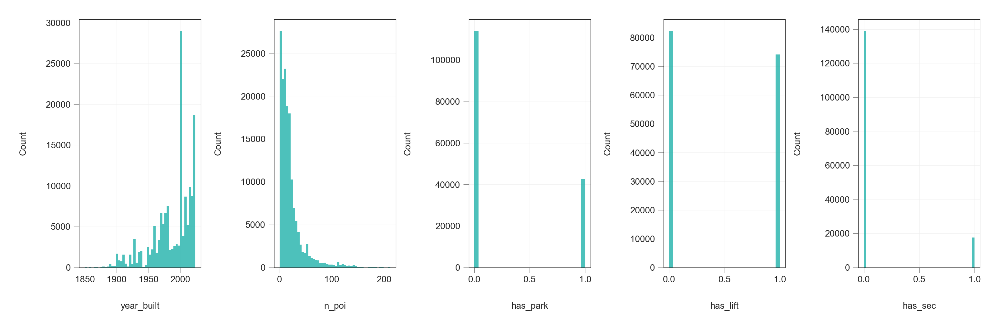

In [61]:
fig, axes = plt.subplots(1, 5, figsize=(18,5))
fig.subplots_adjust(hspace=0.5, wspace=0.6)
for ax, v in zip(axes.flat, ['year_built', 'n_poi', 
                             'has_park', 'has_lift', 'has_sec']):
    sns.distplot(train[v], kde=False, color='lightseagreen', 
                 hist_kws={"alpha": 0.8}, ax=ax)
    ax.set(ylabel="Count");

Text(0, 0.5, 'Price')

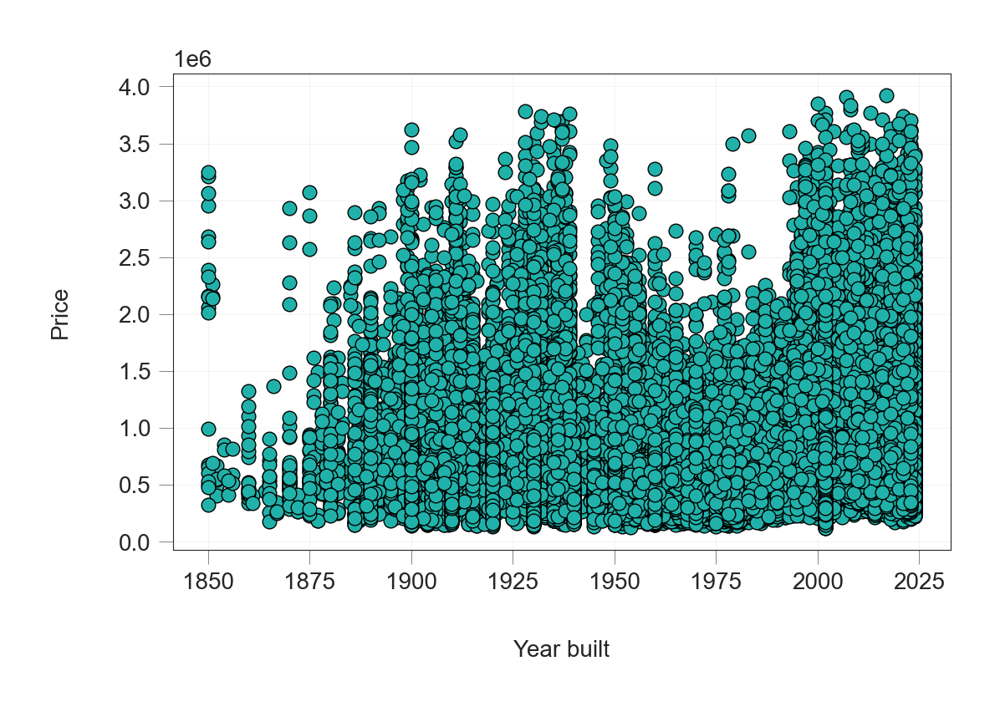

In [62]:
plt.scatter(x=train['year_built'], y=train['price_z'], 
            color='lightseagreen', edgecolors='#000000', linewidths=0.5)
plt.xlabel("Year built") 
plt.ylabel("Price")

The scatterplot indicates a moderate positive relationship between the construction year and apartment price. While there's a wide spread of prices for older buildings, more recently built apartments (post-2000) tend to cluster around higher price ranges. This suggests that newer properties are generally more expensive—likely due to better construction standards, modern infrastructure, or higher demand for newer housing stock.

Text(0, 0.5, 'Price')

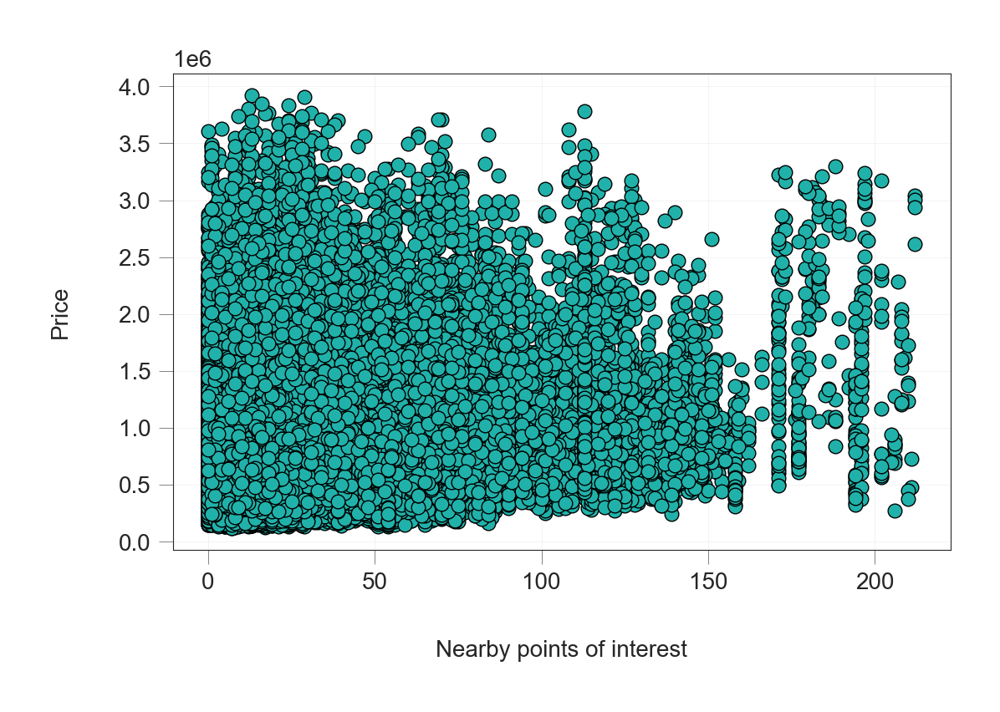

In [63]:
plt.scatter(x=train['n_poi'], y=train['price_z'], 
            color='lightseagreen', edgecolors='#000000', linewidths=0.5)
plt.xlabel("Nearby points of interest") 
plt.ylabel("Price")

The histogram for n_poi (number of nearby points of interest) is heavily right-skewed, indicating that most apartments are located in areas with relatively few nearby amenities, while a small number are situated in highly serviced neighborhoods.

The scatter plot further supports this observation. While prices vary widely across all levels of n_poi, apartments with fewer POIs are more densely clustered across the full price range, suggesting that other factors also strongly influence price. Interestingly, higher POI counts do not necessarily correspond to higher prices, and the relationship appears noisy and less consistent beyond a certain threshold. Although the overall correlation between n_poi and apartment price is moderately positive, the visual evidence suggests that the presence of nearby amenities alone is not a dominant factor in determining price. Rather, it may act as a complementary attribute.

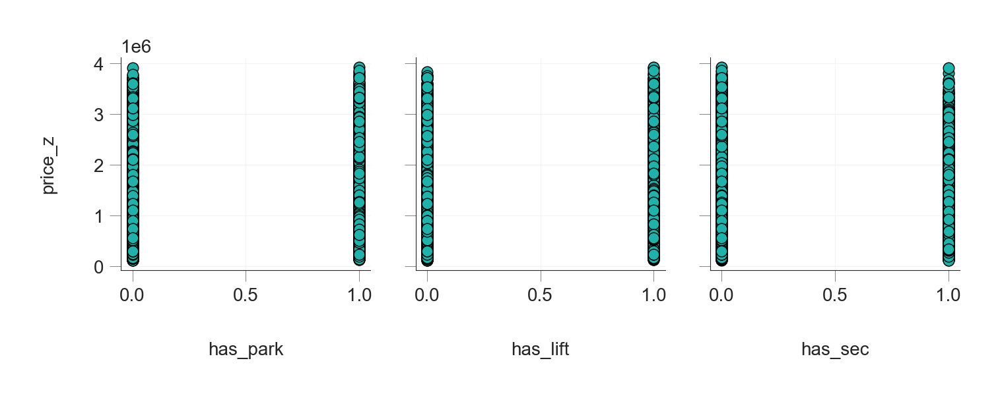

In [64]:
x_vars = ['has_park', 'has_lift', 'has_sec']
g = sns.PairGrid(train, y_vars=["price_z"], x_vars=x_vars);
g.map(plt.scatter, color='lightseagreen', edgecolors='#000000', linewidths=0.5);

The values of variables has_park, has_lift and has_sec are statistically moderate positive correlations.  Apartments with these features tend to have higher prices. Apartments with dedicated parking are somewhat more expensive, likely due to convenience in urban areas. Regarding has_lify variable, especially in taller buildings, lifts are a standard expectation. Apartments in buildings with lifts generally command higher prices. Finally, security guards or other security features slightly raise property values—offering peace of mind ans safety. Since scatterplots illustrates binary variables, we observe that apartments with 1 (yes) in these fields tend to have more upper-end price entries.

##### Relation between Predictor variables

Apart from the target variable, from the plotted matrix we discover a high positive correlation between dim_m2 variable and esimated_maintenance_cost (0.69), market_volatility (0.55) and n_rooms (0.76). There is also positive correlation between n_rooms and esimated_maintenance_cost (0.53), and market_volatility (0.46). Additionaly, there is high positive correlation between distance features. We see the distribution of all listed variables, except distances. Let's plot it: 

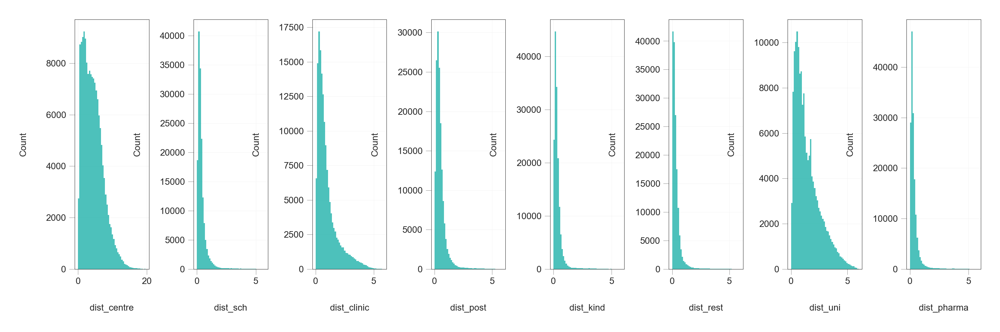

In [65]:
fig, axes = plt.subplots(1, 8, figsize=(18,5))
fig.subplots_adjust(hspace=0.5, wspace=0.6)
for ax, v in zip(axes.flat, ['dist_centre', 'dist_sch', 'dist_clinic', 'dist_post',
                              'dist_kind', 'dist_rest', 'dist_uni', 'dist_pharma']):
    sns.distplot(train[v], kde=False, color='lightseagreen', 
                 hist_kws={"alpha": 0.8}, ax=ax)
    ax.set(ylabel="Count");

The first row of plots shows the distribution of eight distance-related features, such as distance to the city center, schools, clinics, and more. All distance features are right-skewed, with the majority of apartments located close to the listed services. This pattern is expected, as people tend to live in more densely populated urban areas with nearby infrastructure. Distances like dist_sch, dist_post, dist_kind, and dist_pharma have sharp peaks at very short ranges (<1 km), suggesting many homes are within walkable distances to these locations.

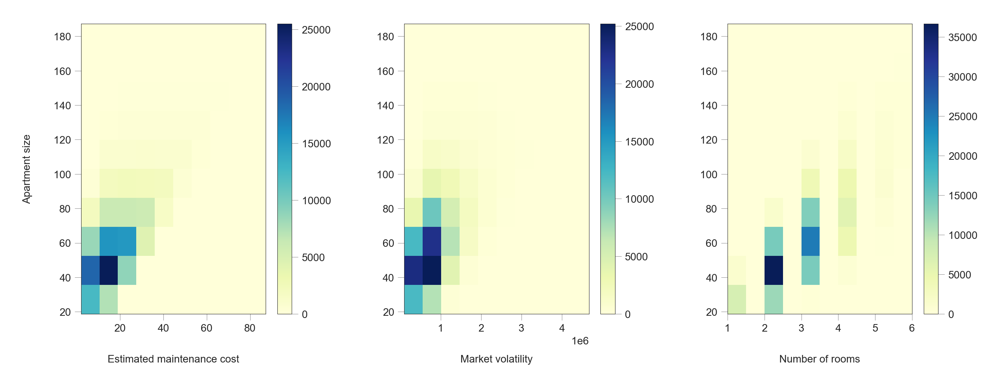

In [66]:
# dim_m2 relations
plt.rc('grid', linewidth=0.05)
fig, axes = plt.subplots(1, 3, figsize=(15,5))
fig.subplots_adjust(hspace=0.5, wspace=0.4)
h1 = axes[0].hist2d(train['estimated_maintenance_cost'], 
                    train['dim_m2'],
                    cmap='YlGnBu');
axes[0].set(xlabel="Estimated maintenance cost", ylabel="Apartment size")
plt.colorbar(h1[3], ax=axes[0]);

h2 = axes[1].hist2d(train['market_volatility'], 
                    train['dim_m2'],
                    cmap='YlGnBu');
axes[1].set(xlabel="Market volatility", ylabel="")
plt.colorbar(h2[3], ax=axes[1]);

h3 = axes[2].hist2d(train['n_rooms'], 
                    train['dim_m2'],
                    cmap='YlGnBu');
axes[2].set(xlabel="Number of rooms", ylabel="")
plt.colorbar(h3[3], ax=axes[2]);
plt.rc('grid', linewidth=0.25)

The heatmap shows a diagonal trend from the bottom-left to upper-right, suggesting a positive relationship between apartment size and estimated maintenance cost. However, the densest region is concentrated around 40–70 m² and 10–30 cost units, indicating that while larger and costlier apartments exist, they are relatively infrequent in the dataset.

Regarding market volatility, we see a diagonal clustering pattern from low to mid values of both axes. This confirms that larger apartments tend to be associated with higher market volatility, although the majority fall in the lower-mid range (around 40–70 m² and under 1.5 million in volatility units).

From the heatmap with number of rooms, we see that as the number of rooms increases, the apartment size also tends to increase.`The densest cluster is at 2–3 rooms and around 40–70 m², showing the most common apartment type. As the number of rooms increases, you can see the cluster moves upward, meaning more rooms typically mean larger apartments — a strong and expected structural relationship.

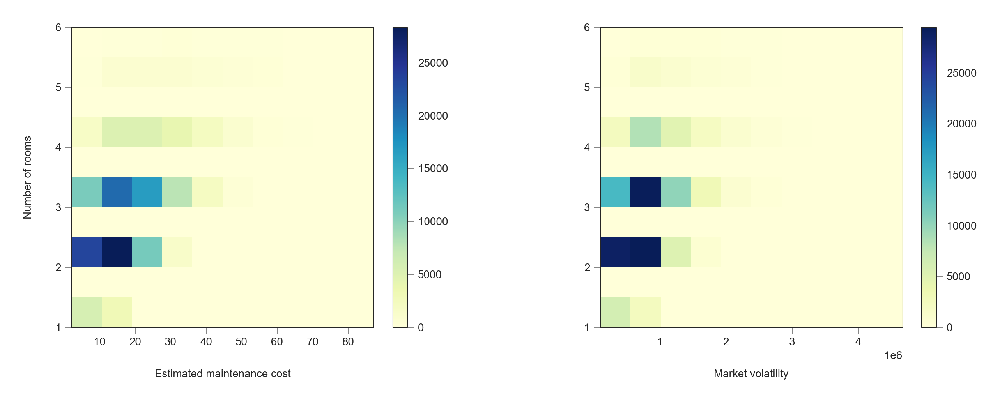

In [67]:
# number of rooms relations
plt.rc('grid', linewidth=0.05)
fig, axes = plt.subplots(1, 2, figsize=(15,5))
fig.subplots_adjust(hspace=0.5, wspace=0.4)
h1 = axes[0].hist2d(train['estimated_maintenance_cost'], 
                    train['n_rooms'],
                    cmap='YlGnBu');
axes[0].set(xlabel="Estimated maintenance cost", ylabel="Number of rooms")
plt.colorbar(h1[3], ax=axes[0]);

h2 = axes[1].hist2d(train['market_volatility'], 
                    train['n_rooms'],
                    cmap='YlGnBu');
axes[1].set(xlabel="Market volatility", ylabel="")
plt.colorbar(h2[3], ax=axes[1]);
plt.rc('grid', linewidth=0.25)

This heatmap shows a clear upward trend — as the number of rooms increases, the estimated maintenance cost also tends to increase. Most properties with:
-2 rooms are concentrated in the 10–25 maintenance cost range (darkest area).<br>
-3 rooms shift slightly rightward, showing costs between 15–35.<br>
-4+ rooms are more spread out and move into higher cost ranges (30+), but are less frequent (lighter shades).<br>

For the market volatility, the plot displays a similar vertical structure. 2- and 3-room apartments dominate in the lower market volatility range (up to 1.5M). As the number of rooms increases, the market volatility tends to increase, although these combinations become much less frequent.

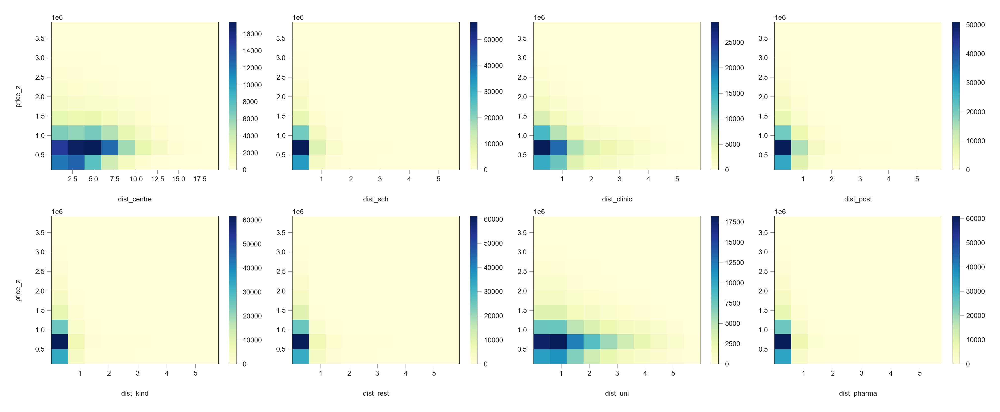

In [68]:
# Distance features relation with price
distance_features = [
    'dist_centre', 'dist_sch', 'dist_clinic', 'dist_post',
    'dist_kind', 'dist_rest', 'dist_uni', 'dist_pharma'
]


fig, axes = plt.subplots(2, 4, figsize=(20, 8))
fig.subplots_adjust(hspace=0.4, wspace=0.3)
plt.rc('grid', linewidth=0.05)
axes = axes.flatten()

for i, feature in enumerate(distance_features):
    h = axes[i].hist2d(train[feature], train['price_z'], cmap='YlGnBu')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('price_z' if i % 4 == 0 else '') 
    plt.colorbar(h[3], ax=axes[i])

plt.tight_layout()
plt.show()

Across nearly all features, prices are higher when distances are shorter — the darkest cells are found in the lower-left areas, where distance is low and price is relatively high. The strongest clustering effect appears for dist_sch and dist_kind. Extremely short distances (<1 km) coincide with high frequency and higher prices.

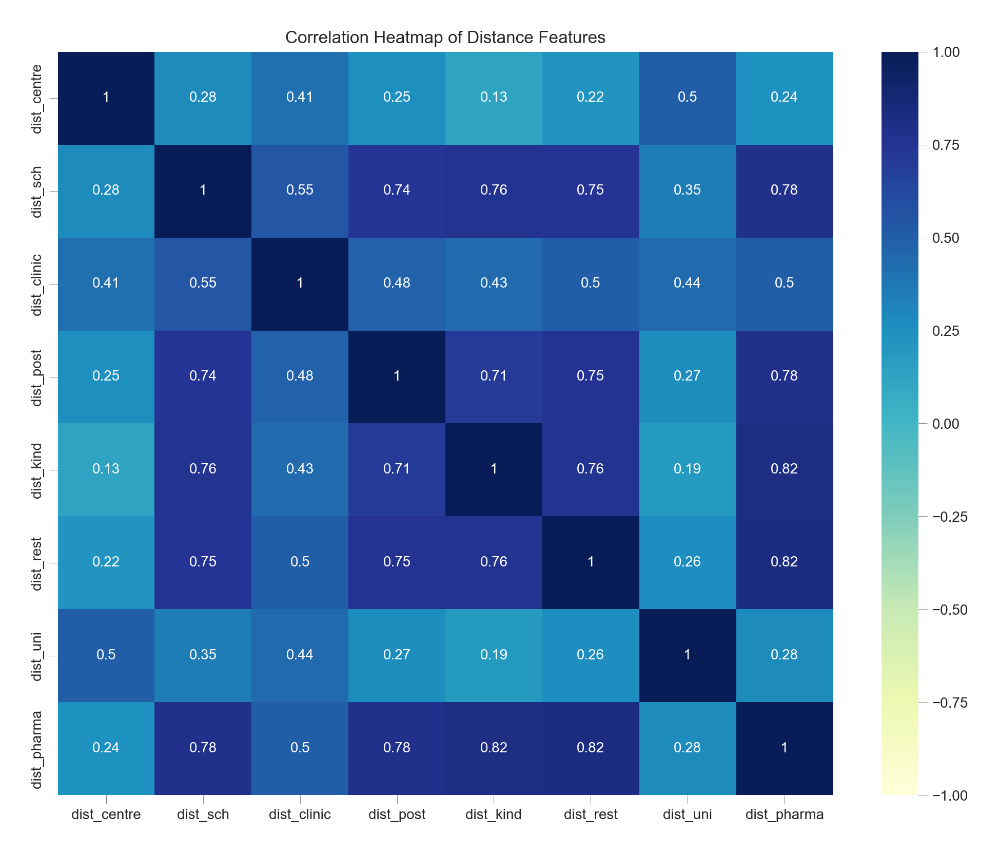

In [69]:
# Distance features relation 
distance_corr = train[distance_features].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(distance_corr, annot=True, cmap='YlGnBu', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of Distance Features')
plt.tight_layout()
plt.show()

There is strong positive correlation between many of these distance related features:

-dist_kind and dist_pharma: 0.82;<br>
-dist_post and dist_pharma: 0.78;<br>
-dist_rest and dist_pharma: 0.82;<br>
-dist_kind and dist_rest: 0.76;<br>
-dist_sch and dist_rest: 0.75;<br>

This makes sense becuase locations with one type of services nearby (like a pharmacy) often have others (like kindergartens or restaurants) due to urban planning. dist_centre is less correlated with the others, suggesting that some apartments close to the city center may not always be near community-level places like clinics or schools.

##### Negative correlation

When we plotted the heatmap, we also discovered a significant negative correlation between price_z and  dist_clinic (-0.10), dist_rest (-0.10), and presence of a storage room (has_store, -0.16). We also want to visualize found correlations.

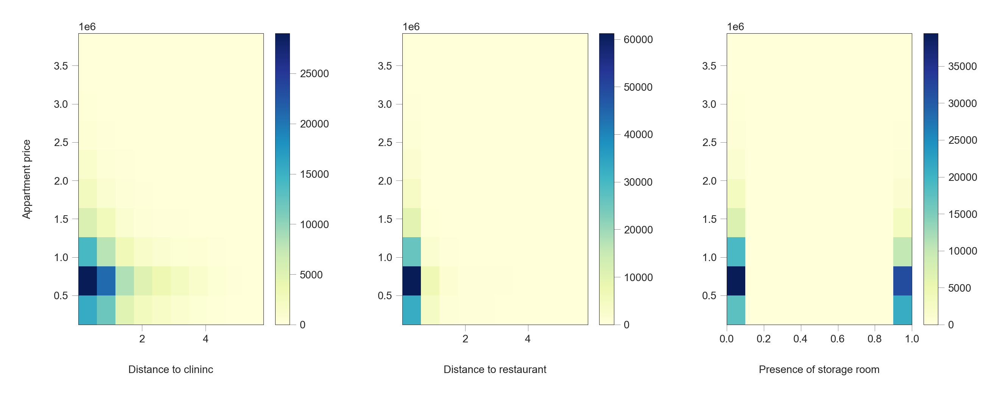

In [70]:
# Price relations
plt.rc('grid', linewidth=0.05)
fig, axes = plt.subplots(1, 3, figsize=(15,5))
fig.subplots_adjust(hspace=0.5, wspace=0.4)
h1 = axes[0].hist2d(train['dist_clinic'], 
                    train['price_z'],
                    cmap='YlGnBu');
axes[0].set(xlabel="Distance to clininc", ylabel="Appartment price")
plt.colorbar(h1[3], ax=axes[0]);

h2 = axes[1].hist2d(train['dist_rest'], 
                    train['price_z'],
                    cmap='YlGnBu');
axes[1].set(xlabel="Distance to restaurant", ylabel="")
plt.colorbar(h2[3], ax=axes[1]);

h3 = axes[2].hist2d(train['has_store'], 
                    train['price_z'],
                    cmap='YlGnBu');
axes[2].set(xlabel="Presence of storage room", ylabel="")
plt.colorbar(h3[3], ax=axes[2]);
plt.rc('grid', linewidth=0.25)

These variables may not dominate price prediction but offer location- and utility-based patterns. Shorter distances to services (clinics, restaurants) are mildly associated with higher apartment prices, confirming urban value preferences. Additionally, storage room presence correlates negatively, potentially reflecting design trade-offs or age/location effects in the dataset.

Additionally, there are high negative correlations between dist_centre and green_space_ratio (-0.83), and n_poi (-0.45). For the variable year_built there are also negative correlations with infrastructure_quality(-0.92), has_store (-0.34) and n_poi (-0.33) variables. Let's investighate them. We only haven't check the distribution for the green_space_ratio and infrastructure_quality variables.

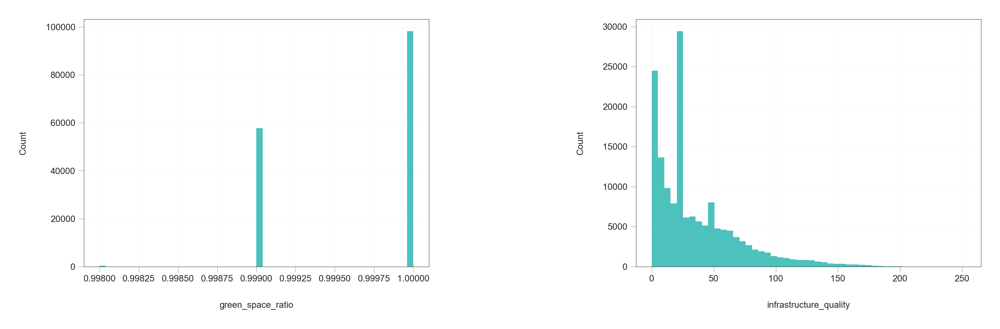

In [71]:
fig, axes = plt.subplots(1, 2, figsize=(18,5))
fig.subplots_adjust(hspace=0.5, wspace=0.6)
for ax, v in zip(axes.flat, ['green_space_ratio', 'infrastructure_quality'
                            ]):
    sns.distplot(train[v], kde=False, color='lightseagreen', 
                 hist_kws={"alpha": 0.8}, ax=ax)
    ax.set(ylabel="Count");

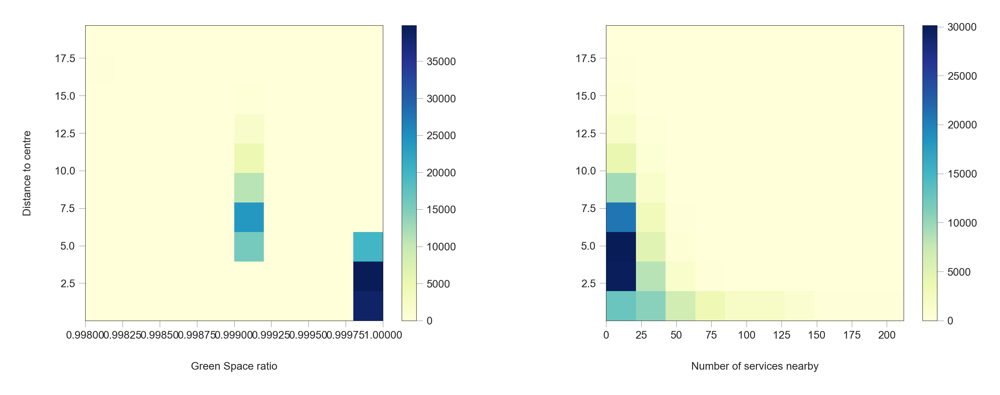

In [72]:
# dist_centre relations
plt.rc('grid', linewidth=0.05)
fig, axes = plt.subplots(1, 2, figsize=(15,5))
fig.subplots_adjust(hspace=0.5, wspace=0.4)
h1 = axes[0].hist2d(train['green_space_ratio'], 
                    train['dist_centre'],
                    cmap='YlGnBu');
axes[0].set(xlabel="Green Space ratio", ylabel="Distance to centre")
plt.colorbar(h1[3], ax=axes[0]);

h2 = axes[1].hist2d(train['n_poi'], 
                    train['dist_centre'],
                    cmap='YlGnBu');
axes[1].set(xlabel="Number of services nearby", ylabel="")
plt.colorbar(h2[3], ax=axes[1]);
plt.rc('grid', linewidth=0.25)

The heatmap confirms that apartments farther from the city center are associated with higher green space ratios. This pattern reflects typical urban planning: city outskirts tend to have more open, undeveloped, or recreational areas compared to dense urban cores. The histogram of green_space_ratio shows that most values cluster near 1, indicating that the vast majority of apartments are located in highly green areas—likely those farther from the center.

Apartments located closer to the city center typically have significantly more nearby points of interest, as shown in the heatmap and distribution plots. This is consistent with expectations: central urban zones generally offer greater access to amenities such as shops, restaurants, and public services.

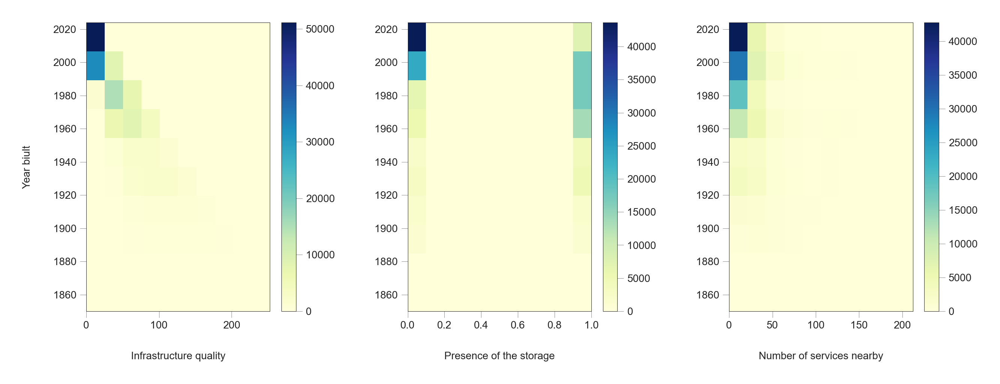

In [73]:
# year_built relations
plt.rc('grid', linewidth=0.05)
fig, axes = plt.subplots(1, 3, figsize=(15,5))
fig.subplots_adjust(hspace=0.5, wspace=0.4)
h1 = axes[0].hist2d(train['infrastructure_quality'], 
                    train['year_built'],
                    cmap='YlGnBu');
axes[0].set(xlabel="Infrastructure quality", ylabel="Year biult")
plt.colorbar(h1[3], ax=axes[0]);

h2 = axes[1].hist2d(train['has_store'], 
                    train['year_built'],
                    cmap='YlGnBu');
axes[1].set(xlabel="Presence of the storage", ylabel="")
plt.colorbar(h2[3], ax=axes[1]);

h3 = axes[2].hist2d(train['n_poi'], 
                    train['year_built'],
                    cmap='YlGnBu');
axes[2].set(xlabel="Number of services nearby", ylabel="")
plt.colorbar(h3[3], ax=axes[2]);
plt.rc('grid', linewidth=0.25)

An extremely strong negative correlation suggests that newer buildings are typically located in areas with lower infrastructure quality, based on the current index. The heatmap supports this, showing a clear downward trend: as construction year increases, infrastructure scores drop. This may indicate that older, central districts have more established infrastructure (roads, schools, utilities), while newer developments, often in expanding suburbs, are still catching up.

The presence of dedicated storage rooms is more common in older buildings. The heatmap reveals that buildings constructed before 1980 are far more likely to include this feature, perhaps due to older design norms or different living expectations.

A negative relationship exists between year built and the number of POIs. Apartments in older buildings, typically located in more central, established areas, tend to have a higher number of services in close proximity. Newer buildings are more commonly situated in recently developed or suburban areas with fewer existing places with services.

##### Additional check of the indexes 

We also want to see the correlation and relationship of indexes (neighborhood_crime_rate, popularity_index, ect.). The goal is to check whether these variables would be useful as an explanatory for the target variable. Based on the results, we can do feature engineering properly. 

Check src_month variable as well to whether the month has any meaningful trend.

In [74]:
train[['market_volatility', 'infrastructure_quality', 'neighborhood_crime_rate',
    'popularity_index', 'green_space_ratio', 'estimated_maintenance_cost',
    'global_economic_index', 'price_z']].corr()['price_z'].sort_values(ascending=False)

price_z                                      1.00
market_volatility                            0.97
estimated_maintenance_cost                   0.39
global_economic_index                        0.00
popularity_index                             0.00
neighborhood_crime_rate                     -0.00
green_space_ratio                           -0.07
infrastructure_quality                      -0.09
Name: price_z, dtype: float64

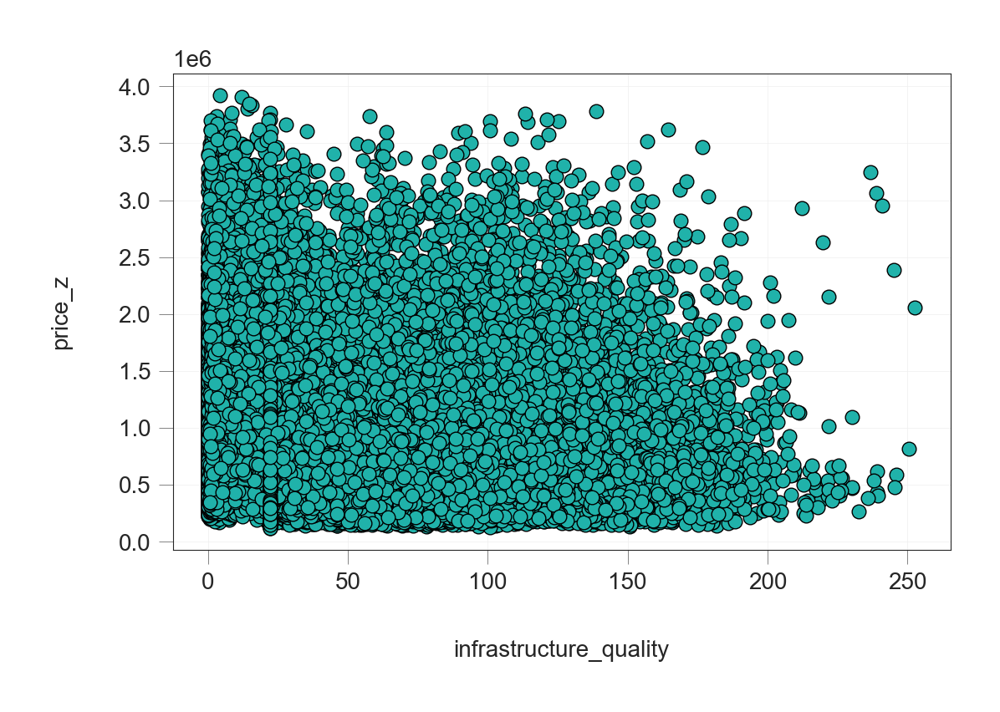

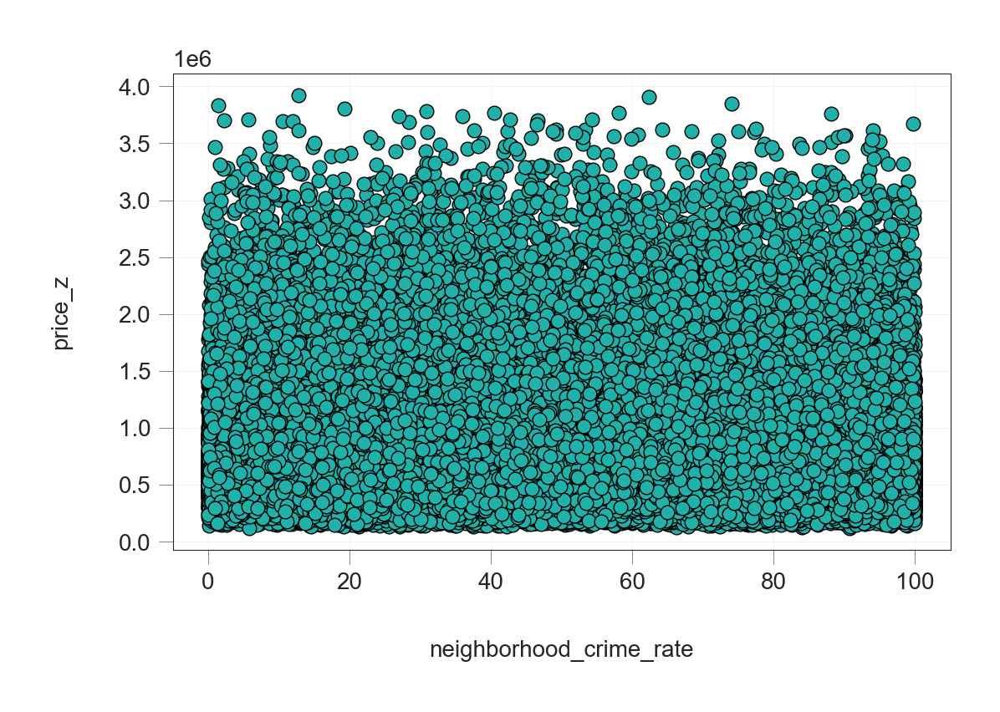

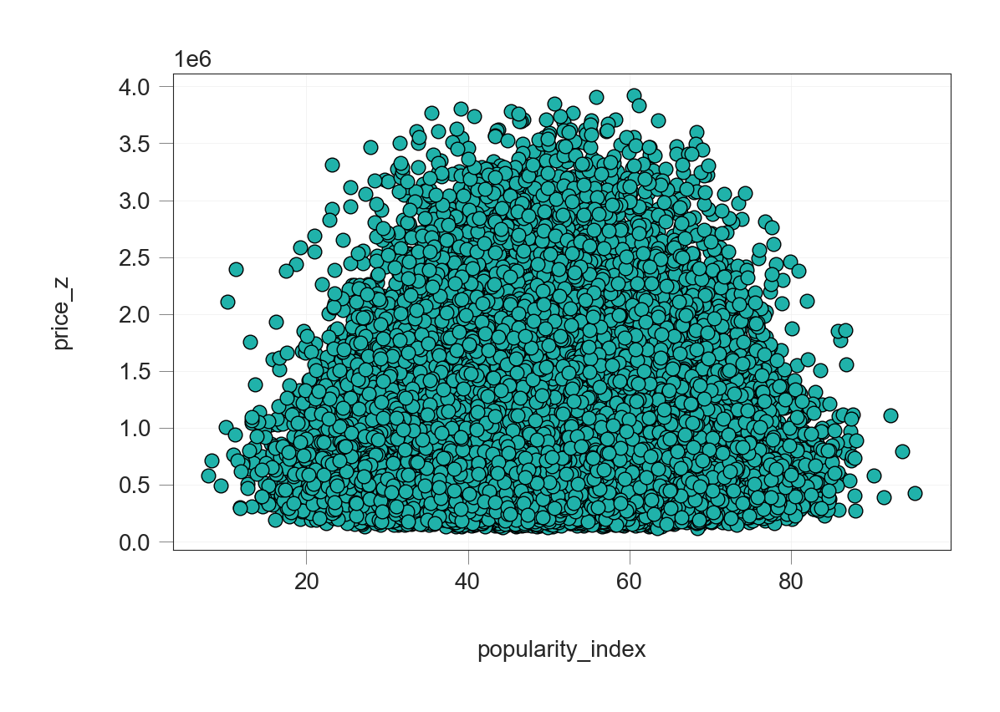

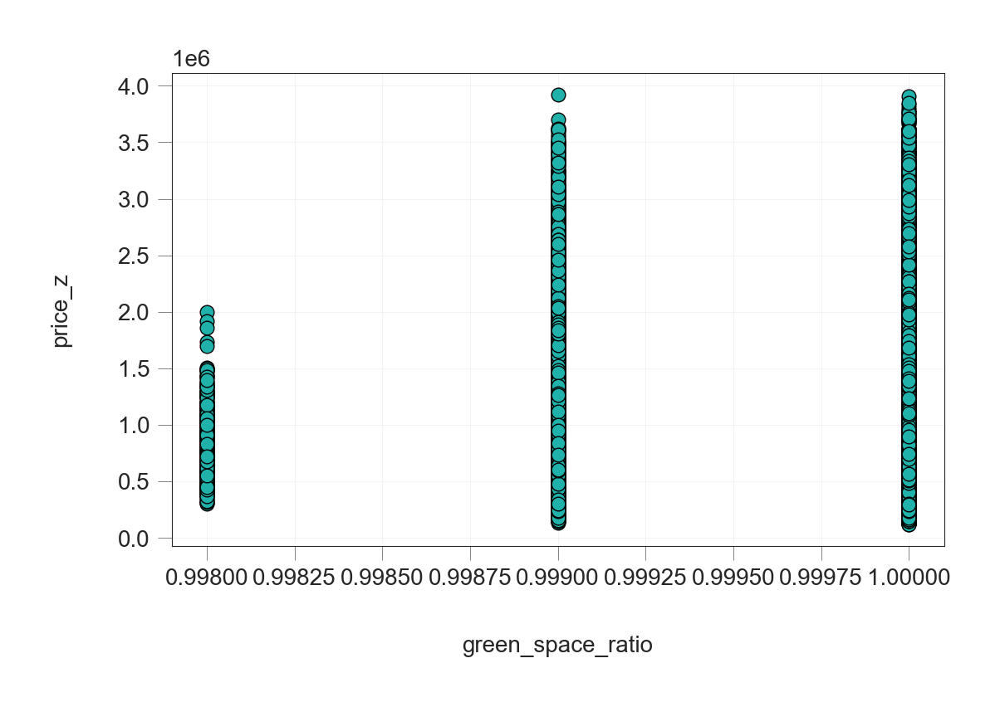

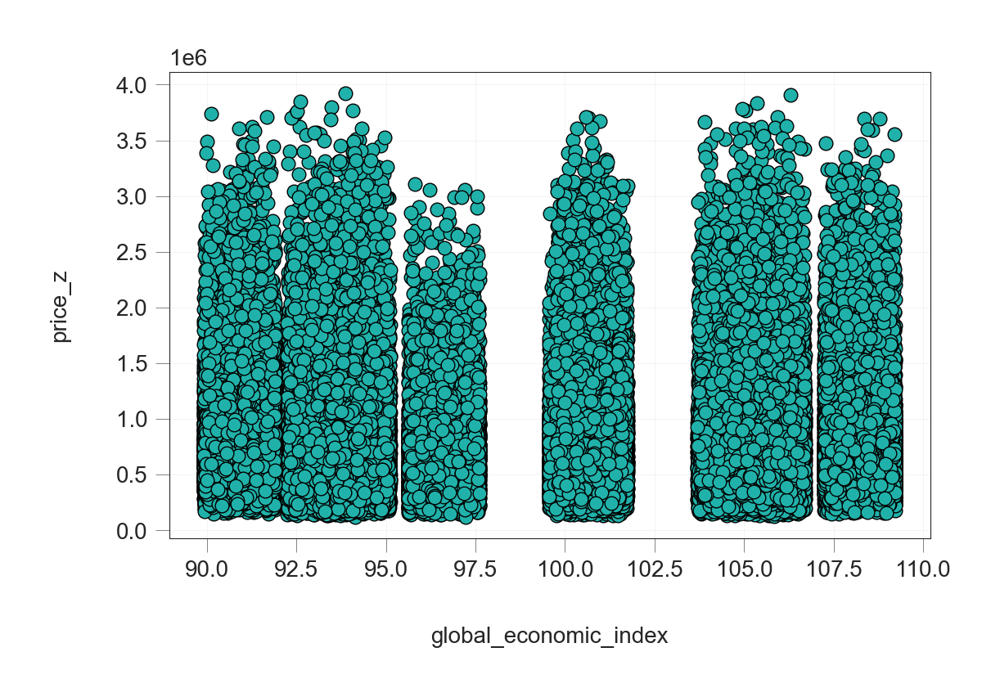

In [75]:
indexes = ['infrastructure_quality', 'neighborhood_crime_rate',
        'popularity_index', 'green_space_ratio', 'global_economic_index']

for i in indexes:
    sns.scatterplot(x=train[i], y=train['price_z'],
    color='lightseagreen', edgecolors='#000000', linewidths=0.5)
    plt.show()

In [76]:
train[indexes].nunique().sort_values()

green_space_ratio               3
popularity_index             6095
neighborhood_crime_rate     10001
infrastructure_quality      15192
global_economic_index      156454
dtype: int64

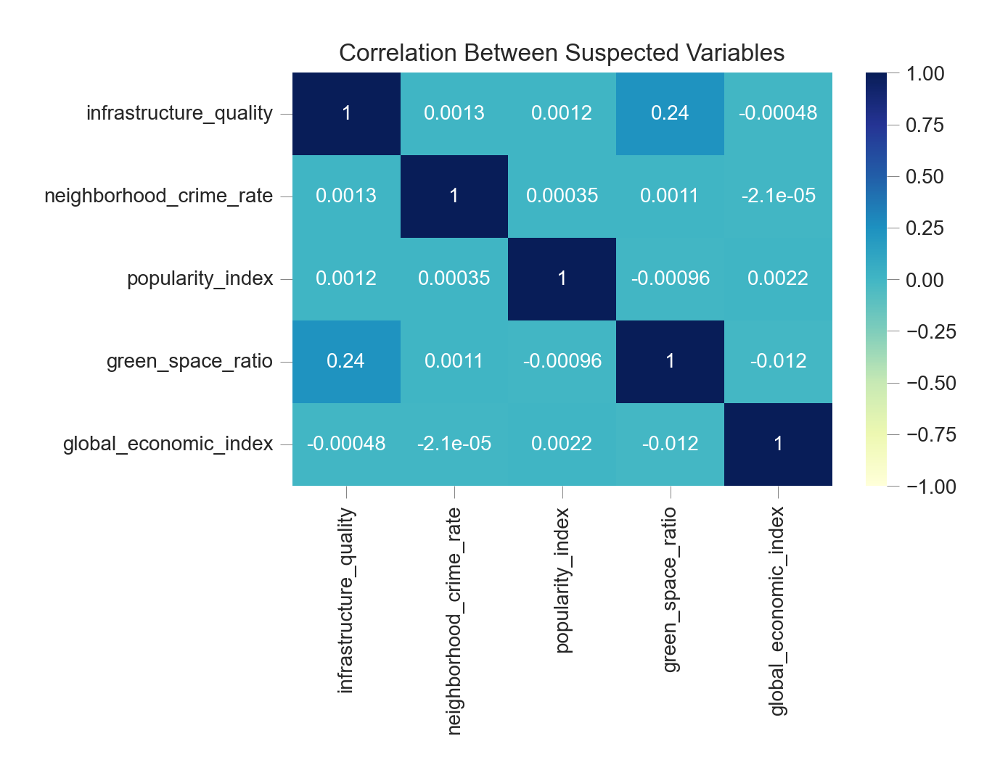

In [77]:
sns.heatmap(train[indexes].corr(), annot=True, cmap='YlGnBu', vmin=-1, vmax=1)
plt.title('Correlation Between Suspected Variables')
plt.show()

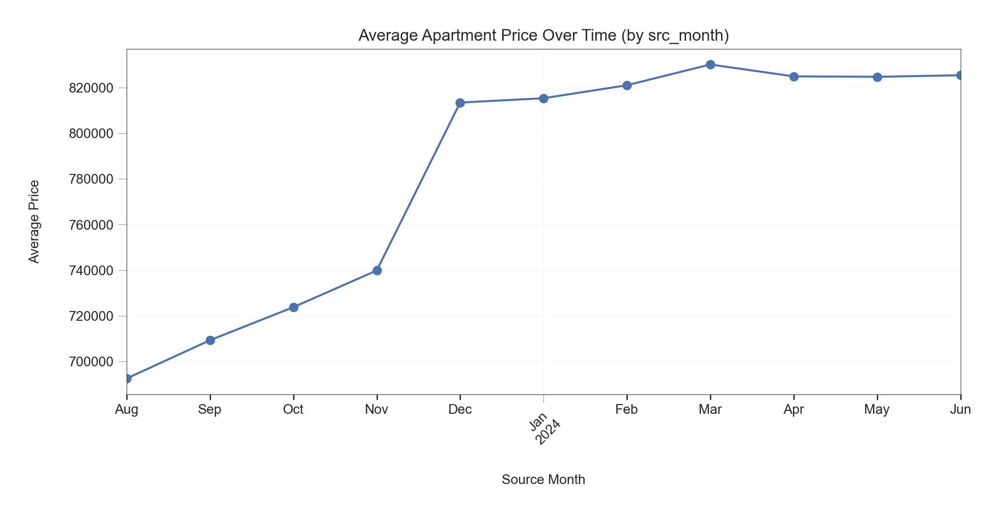

In [78]:
train['src_month'] = pd.to_datetime(train['src_month'], format='%Y-%m')
monthly_avg_price = train.groupby('src_month')['price_z'].mean()
plt.figure(figsize=(10, 5))
monthly_avg_price.plot(marker='o')
plt.title('Average Apartment Price Over Time (by src_month)')
plt.xlabel('Source Month')
plt.ylabel('Average Price')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### Feature engineering 
In this section, we use the insights from Exploratory Data Analysis section to engineer the features of our dataset.
##### Creating new derived features
We introduce a new feature building_age by substracting the apartment's construction year from the current year: building_age = current_year - year_built 
##### Distance-based features
We create a new feature service_count_1km representing the number of key services located within 1 km of the apartment. Then, for each service-related distance variable (excluding distance to the city centre), we create binary indicators equal to 1 if the apartment is within 1 km of that service, and 0 otherwise. To reduce multicollinearity, the original continuous distance features (except dist_centre) are dropped after transformation. 
##### Log transform features
To reduce skewness and compress extreme values, the following variables are log-transformed using log1p(): dist_cenre, n_poi, estimated_maintenance_cost and dim_m2. 
##### One-hot encoding
Categorical features such as own_type, obj_type, build_mat, cond_class, and loc_code are converted into dummy variables using one-hot encoding. This allows models to interpret category membership without assuming ordinality.
#####  Infrastructure quality binning
The infrastructure_quality variable is binned into 4 quantiles using qcut, creating a categorical representation of the infrastructure index that helps capture non-linear effects.
##### Drop 
Based on EDA results, the following features were found to have little or no explanatory power for the target variable (price_z) and were therefore removed from the dataset: unit_id (identifier, no predictive value), neighborhood_crime_rate, popularity_index, green_space_ratio, global_economic_index, src_month. These variables either lacked variance, had no meaningful correlation with price, or were randomly simulated features not grounded in the data-generating process.


In [79]:
train.columns

Index(['unit_id', 'obj_type', 'dim_m2', 'n_rooms', 'floor_no', 'floor_max',
       'year_built', 'dist_centre', 'n_poi', 'dist_sch', 'dist_clinic',
       'dist_post', 'dist_kind', 'dist_rest', 'dist_uni', 'dist_pharma',
       'own_type', 'build_mat', 'cond_class', 'has_park', 'has_balcony',
       'has_lift', 'has_sec', 'has_store', 'price_z', 'src_month', 'loc_code',
       'market_volatility', 'infrastructure_quality',
       'neighborhood_crime_rate', 'popularity_index', 'green_space_ratio',
       'estimated_maintenance_cost', 'global_economic_index'],
      dtype='object')

In [80]:
def feature_engineering(dataset):
    dt = dataset
    
    # Calculate building age
    current_year = int(datetime.today().strftime('%Y'))
    dt['building_age'] = current_year - dt['year_built'] 
    dt.drop(columns=['year_built'], inplace=True)

    # Log transform of building_age
    dt['log_building_age'] = np.log1p(dt['building_age'])

    # Count number of services within 1 km
    dist_cols = ['dist_sch', 'dist_clinic', 'dist_post', 'dist_kind', 'dist_rest', 'dist_uni', 'dist_pharma']
    dt['services_count_1km'] = (dt[dist_cols] < 1).sum(axis=1)

    # Check whether distance to the services within 1 km   <--- Checked, not effective
    # for col in dist_cols:
    #     dt[f'{col}_1km'] = (dt[col] < 1).astype(int)
    
    dt.drop(columns=['dist_sch', 'dist_clinic', 'dist_post', 'dist_kind', 'dist_rest', 'dist_uni', 'dist_pharma'], inplace=True)
    
    # Log transform dist_centre
    dt['log_dist_centre'] = np.log1p(dt['dist_centre'])
    dt.drop(columns=['dist_centre'], inplace=True)

    # Log transform of n_poi
    dt['log_n_poi'] = np.log1p(dt['n_poi'])

    # Log transform of estimated_maintenance_cost
    dt['log_estimated_maintenance_cost'] = np.log1p(dt['estimated_maintenance_cost'])

    # Log transform of dim_m2
    dt['log_dim_m2'] = np.log1p(dt['dim_m2'])
    # dt.drop(columns=['dim_m2'], inplace=True)       <--- Checked, not effective

    # Quantile binning of infrastructure_quality
    try:
        dt['infrastructure_quality_bin'] = pd.qcut(dt['infrastructure_quality'], q=4, labels=False, duplicates='drop')
    except ValueError:
        dt['infrastructure_quality_bin'] = np.nan
    dt.drop(columns=['infrastructure_quality'], inplace=True)    

    # Divide src_month to year and month                                     <--- Checked, not effective
    # dt['src_month'] = pd.to_datetime(dt['src_month'], format='%Y-%m')
    # dt['src_year'] = dt['src_month'].dt.year
    # dt['src_mnth'] = dt['src_month'].dt.month
    dt = dt.drop(columns='src_month')      

    # One-hot encode for own_type,obj_type, build_mat, cond_class and loc_code
    onehot_cols = ['own_type','obj_type', 'build_mat', 'cond_class', 'loc_code']
    dt = pd.get_dummies(dt, columns=onehot_cols, prefix=onehot_cols, drop_first=False)    

    # Drop variables 
    dt.drop(columns=['unit_id','green_space_ratio', 'neighborhood_crime_rate', 'popularity_index', 'global_economic_index'], inplace=True)

    return dt     

In [81]:
train = feature_engineering(train)

In [82]:
train.columns

Index(['dim_m2', 'n_rooms', 'floor_no', 'floor_max', 'n_poi', 'has_park',
       'has_balcony', 'has_lift', 'has_sec', 'has_store', 'price_z',
       'market_volatility', 'estimated_maintenance_cost', 'building_age',
       'log_building_age', 'services_count_1km', 'log_dist_centre',
       'log_n_poi', 'log_estimated_maintenance_cost', 'log_dim_m2',
       'infrastructure_quality_bin', 'own_type_12631efb', 'own_type_4e625087',
       'own_type_bfb8fe10', 'obj_type_0c238f18', 'obj_type_0d6c4dfc',
       'obj_type_2a6d5c01', 'build_mat_7ceffe3b', 'build_mat_7f8c00f9',
       'cond_class_53cced8d', 'cond_class_a2881958', 'loc_code_0ab06839',
       'loc_code_143768f7', 'loc_code_378f340c', 'loc_code_3cb4aaff',
       'loc_code_533f6886', 'loc_code_570cb745', 'loc_code_64a58667',
       'loc_code_6900ba06', 'loc_code_693f303c', 'loc_code_765f79ed',
       'loc_code_81b10147', 'loc_code_8d5a4f0c', 'loc_code_a6d54bd1',
       'loc_code_e0cff11b', 'loc_code_ece39f3d'],
      dtype='object')

##### Feature scaling
In order to make all algorithms work properly with our data, we need to scale the features in our dataset. We will use a helpful function named StandardScaler() from the Scikit-Learn package. 

In [ ]:
scaler = StandardScaler()
# We need to fit the scaler to our data before transformation
train.loc[:, train.columns != 'price_z'] = scaler.fit_transform(
    train.loc[:, train.columns != 'price_z'])

##### Splitting the data set 
We need to train, validate and test our model. So we will split our dataset into three parts, one for training, second for the validation and  the other for testing.

In [84]:
from sklearn.model_selection import train_test_split

# Splitting the data set to train, test and validation samples. 
X_temp, X_test, y_temp, y_test = train_test_split(
    train.drop('price_z', axis=1),
    train[['price_z']],
    test_size=0.2,  
    random_state=3
)

X_train, X_val, y_train, y_val = train_test_split(
    X_temp,
    y_temp,
    test_size=0.2,  
    random_state=3
)

### Modeling

#### Linear Regression
For Linear Regression, we will choose two algorithmic implementations: Ridge Regression and Elastic Net. We will use the implementations provided in the Scikit-Learn package of these algorithms.

##### Ridge
Ridge regression is a regularized linear regression model that includes an L2 penalty term. It’s especially effective when dealing with high-dimensional data and multicollinearity. The Ridge regression especially goofor real estate industry determine a house's or apartment final sale prices. Ridge regression corrects for this form of model complexity by reducing total feature weights on the model’s final predicted value. (https://www.ibm.com/think/topics/ridge-regression, https://towardsdatascience.com/ridge-regression-for-better-usage)

In [ ]:
# parameter_space = {
#     "alpha": [1, 10, 100, 290, 500],
#     "fit_intercept": [True, False],
#     "solver": ['svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga'],
# }

# clf = GridSearchCV(Ridge(random_state=3), parameter_space, n_jobs=-1,
#                    cv=10, scoring="neg_mean_absolute_error")

# clf.fit(X_train, y_train)
# print("Best parameters:")
# print(clf.best_params_)

Best parameters:
{'alpha': 500, 'fit_intercept': True, 'solver': 'svd'}


In [ ]:
# # Ridge on validation set 
# ridge_model = Ridge(random_state=3, **clf.best_params_) 
# ridge_model.fit(X_train, y_train) 
# y_val_pred_ridge = ridge_model.predict(X_val) 

# ridge_val_mae = mean_absolute_error(y_val, y_val_pred_ridge) 
# print("Ridge MAE on validation set:", ridge_val_mae) 

Ridge MAE on validation set: 71234.44200692684


In [ ]:
# ridge_model_final = Ridge(random_state=3, **clf.best_params_) 
# ridge_model_final.fit(X_temp, y_temp) 
# y_test_pred = ridge_model_final.predict(X_test) 


# ridge_test_mae = mean_absolute_error(y_test, y_test_pred) 
# ridge_test_mape = mean_absolute_percentage_error(y_test, y_test_pred) 
# ridge_test_r2 = r2_score(y_test, y_test_pred) 
# ridge_test_rmse = root_mean_squared_error(y_test, y_test_pred)


# print("Final Ridge Performance on Test Set:")
# print(f"Final Ridge MAE on test set:  {ridge_test_mae:,.0f}")
# print(f"Final Ridge MAPE on test set: {ridge_test_mape:.2%}")
# print(f"Final Ridge R^2 on test set:   {ridge_test_r2:.3f}")
# print(f"Final Ridge RMSE on test set: {ridge_test_rmse:,.0f}")


Final Ridge Performance on Test Set:
Final Ridge MAE on test set:  71,322
Final Ridge MAPE on test set: 9.24%
Final Ridge R^2 on test set:   0.950
Final Ridge RMSE on test set: 95,928


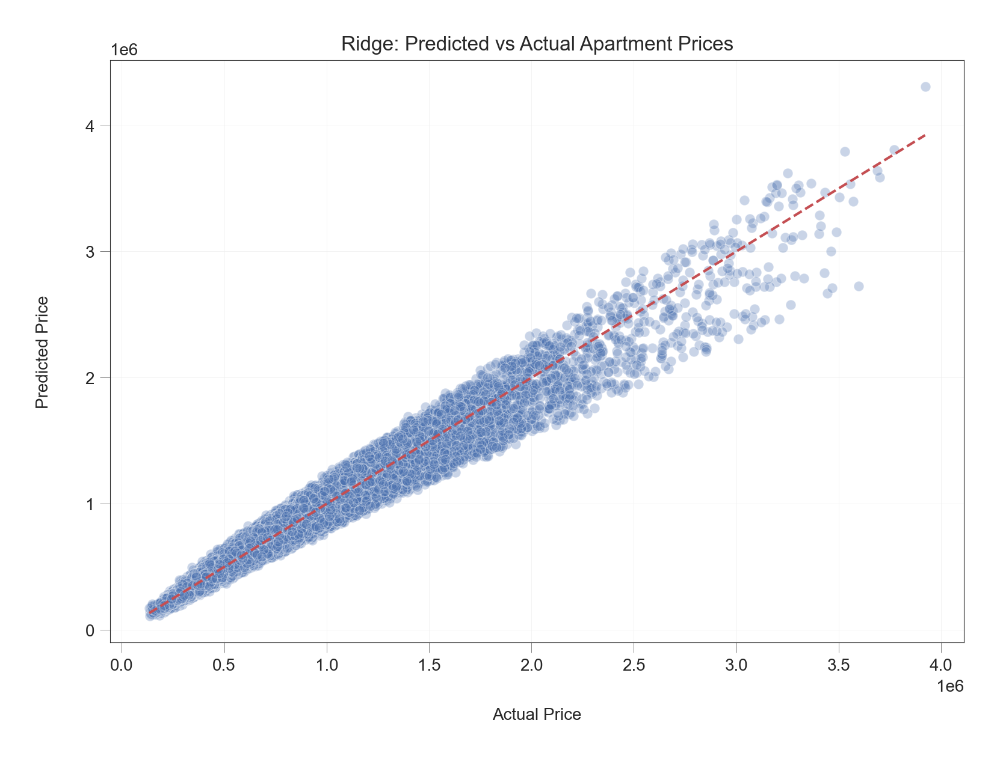

In [ ]:
# y_test_flat = y_test.values.ravel()
# y_pred_flat = y_test_pred.ravel()

# plt.figure(figsize=(8, 6))
# sns.scatterplot(x=y_test_flat, y=y_pred_flat, alpha=0.3)
# plt.plot([y_test_flat.min(), y_test_flat.max()],
#          [y_test_flat.min(), y_test_flat.max()],
#          '--r')
# plt.xlabel("Actual Price")
# plt.ylabel("Predicted Price")
# plt.title("Ridge: Predicted vs Actual Apartment Prices")
# plt.tight_layout()
# plt.show()

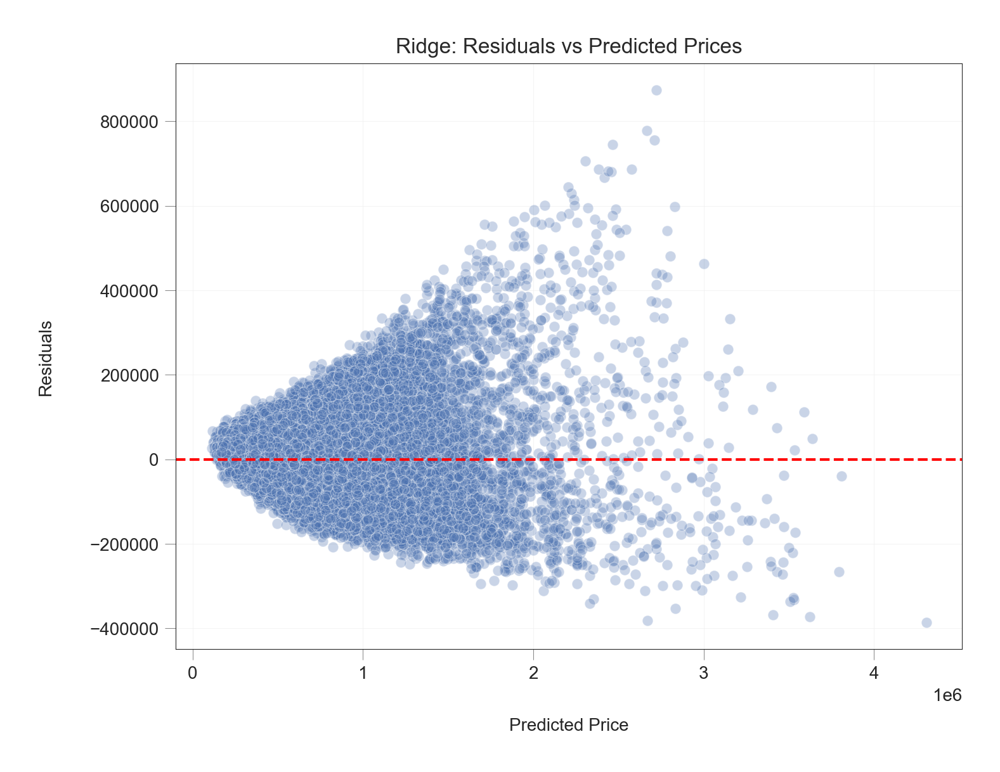

In [ ]:
# residuals = y_test.values.flatten() - y_test_pred

# plt.figure(figsize=(8, 6))
# sns.scatterplot(x=y_test_pred, y=residuals, alpha=0.3)
# plt.axhline(0, linestyle='--', color='red')
# plt.xlabel("Predicted Price")
# plt.ylabel("Residuals")
# plt.title("Ridge: Residuals vs Predicted Prices")
# plt.show()

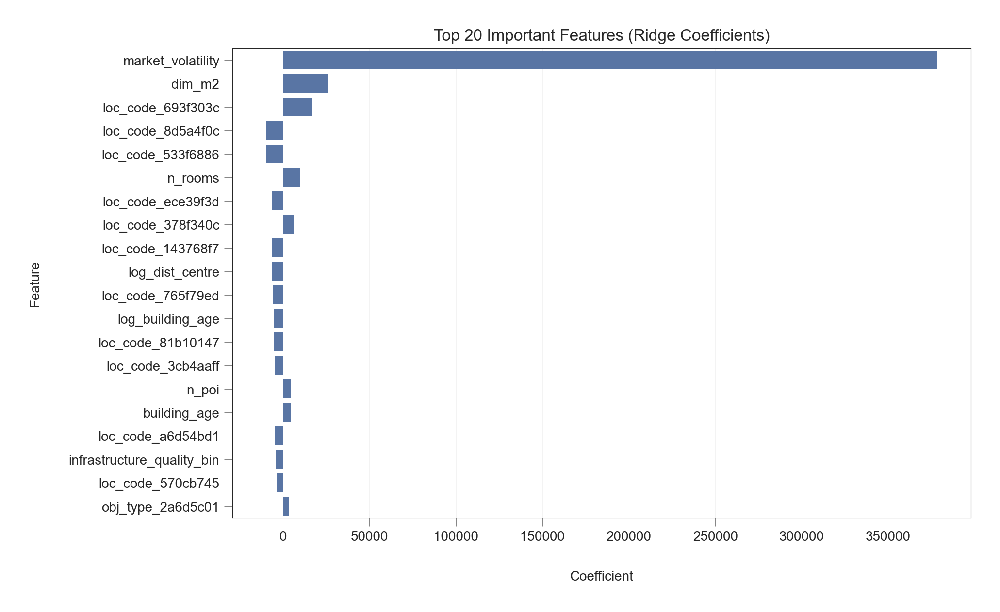

In [ ]:
# coefs = ridge_model_final.coef_.flatten()
# features = X_temp.columns

# coef_df = pd.DataFrame({'Feature': features, 'Coefficient': coefs})
# coef_df['abs'] = coef_df['Coefficient'].abs()
# coef_df_sorted = coef_df.sort_values(by='abs', ascending=False).head(20)

# plt.figure(figsize=(10, 6))
# sns.barplot(x='Coefficient', y='Feature', data=coef_df_sorted)
# plt.title("Top 20 Important Features (Ridge Coefficients)")
# plt.tight_layout()
# plt.show()

In [ ]:
# kf = KFold(n_splits=10, shuffle=True, random_state=3)
# mae_scores = []

# for train_idx, val_idx in kf.split(X_temp):  
#     X_tr, X_val_k = X_temp.iloc[train_idx], X_temp.iloc[val_idx]
#     y_tr, y_val_k = y_temp.iloc[train_idx], y_temp.iloc[val_idx]
    
#     model = Ridge(random_state=3, **clf.best_params_)
#     model.fit(X_tr, y_tr)
#     y_val_pred = model.predict(X_val_k)
#     mae = mean_absolute_error(y_val_k, y_val_pred)
#     mae_scores.append(mae)

# print("Mean MAE across folds:", np.mean(mae_scores))
# print("MAE std across folds:", np.std(mae_scores))

Mean MAE across folds: 71350.74373887078
MAE std across folds: 631.5678600778847


Based on the best parameters suggestions, alpha = 500, that indicates stronger regularization and suggests Ridge regression is reducing overfitting in high-dimensional feature space. The differences of MAE between validation, test, and cross-validated scores are very small, that also supports model doesn't suffer from overfitting or underfitting. 

From the top features we can see market_volatility dominates the model. As discussed earlier, this variable alone explains around 94% of the variance. Its dominance likely overshadows other predictors. dim_m2 and n_rooms follow next — both expected for price prediction since they directly relate to apartment size and usability.loc_code_... — Several location indicators are retained, suggesting geography plays an important role, which makes sense in real estate. 

The residuals vs. predicted price plot shows a funnel-shaped distribution (heteroscedasticity), indicating that residuals increase in magnitude as the predicted price grows. The model underestimates high-priced apartments and slightly overestimates lower-priced ones. This means that the model performs best on moderately priced apartments and has reduced precision on the extremes. 

The scatterplot of predicted vs. actual values aligns close along the diagonal. The tight clustering along the identity line confirms that model captures the underlying structure of the price distribution. Systematic bias is minimal, aside from a tendency to underfit extreme values slightly.

##### Elastic Net
The next model that will be tested is Elastic net. So, this model incorporates two penalties to control model complexity: L1 (from Lasso) and L2 (from Ridge). This model would be helpful for our prediction since we are dealing with high-dimensional data as well. This model useful for price prediction where many features are correlated. Elastic Net helps manage multicollinearity while selecting the most impactful features for accurate predictions.(https://medium.com/data-scientists-diary/elastic-net-explained-c5d0cc4a42b4)   

In [ ]:
# parameter_space = {
#     "alpha": [1, 10, 100, 280, 500],
#     "l1_ratio": [0.5, 1],
#     "fit_intercept": [True, False],
# }

# clf = GridSearchCV(ElasticNet(random_state=3), parameter_space, 
#                    n_jobs=-1, cv=10, scoring="neg_mean_absolute_error")

# clf.fit(X_train, y_train)
# print("Best parameters:")
# print(clf.best_params_)

Best parameters:
{'alpha': 1, 'fit_intercept': True, 'l1_ratio': 1}


As we can see, the Elastic net model is reduced to the Lasso regression (l1_ratio). Lasso helped with feature selection by zeroing out irrelevant ones.

In [ ]:
# # Evaluate on the validation set
# elasticnet_model = ElasticNet(random_state=3, **clf.best_params_)
# elasticnet_model.fit(X_train, y_train)

# y_val_pred = elasticnet_model.predict(X_val)
# val_mae = mean_absolute_error(y_val, y_val_pred)
# print("Elastic Net(L1) MAE on validation set:", val_mae)

Elastic Net(L1) MAE on validation set: 71389.05067764594


In [ ]:
# elasticnet_final = ElasticNet(random_state=3, **clf.best_params_)
# elasticnet_final.fit(X_temp, y_temp)

# # Evaluate on test set
# y_test_pred = elasticnet_final.predict(X_test)

# elasticnet_mae = mean_absolute_error(y_test, y_test_pred) 
# elasticnet_mape = mean_absolute_percentage_error(y_test, y_test_pred) 
# elasticnet_r2 = r2_score(y_test, y_test_pred) 
# elasticnet_rmse = root_mean_squared_error(y_test, y_test_pred)

# print("Final Elastic Net Performance on Test Set:")
# print(f"Final Elastic Net(L1) MAE on test set:  {elasticnet_mae:,.0f}")
# print(f"Final Elastic Net(L1) MAPE on test set: {elasticnet_mape:.2%}")
# print(f"Final Elastic Net(L1) R^2 on test set:   {elasticnet_r2:.3f}")
# print(f"Final Elastic Net(L1) RMSE on test set: {elasticnet_rmse:,.0f}")

Final Elastic Net Performance on Test Set:
Final Elastic Net(L1) MAE on test set:  71,441
Final Elastic Net(L1) MAPE on test set: 9.24%
Final Elastic Net(L1) R^2 on test set:   0.950
Final Elastic Net(L1) RMSE on test set: 95,889


In [ ]:
# kf = KFold(n_splits=10, shuffle=True, random_state=3)
# mae_scores = []

# for train_idx, val_idx in kf.split(X_temp):  # use full training data here
#     X_tr, X_val_k = X_temp.iloc[train_idx], X_temp.iloc[val_idx]
#     y_tr, y_val_k = y_temp.iloc[train_idx], y_temp.iloc[val_idx]
    
#     model = ElasticNet(random_state=3, **clf.best_params_)
#     model.fit(X_tr, y_tr)
#     y_val_pred = model.predict(X_val_k)
#     mae = mean_absolute_error(y_val_k, y_val_pred)
#     mae_scores.append(mae)

# print("Mean MAE across folds:", np.mean(mae_scores))
# print("MAE std across folds:", np.std(mae_scores))

Mean MAE across folds: 71486.7387717427
MAE std across folds: 623.2323148450164


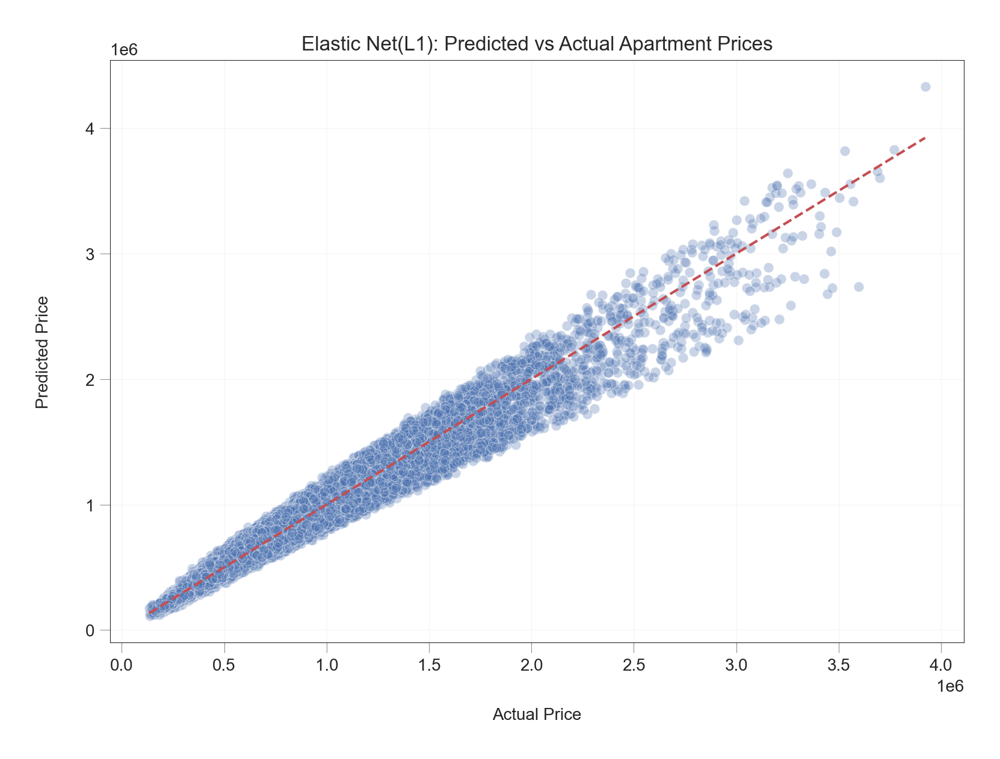

In [ ]:
# y_test_flat = y_test.values.ravel()
# y_pred_flat = y_test_pred.ravel()

# plt.figure(figsize=(8, 6))
# sns.scatterplot(x=y_test_flat, y=y_pred_flat, alpha=0.3)
# plt.plot([y_test_flat.min(), y_test_flat.max()],
#          [y_test_flat.min(), y_test_flat.max()],
#          '--r')
# plt.xlabel("Actual Price")
# plt.ylabel("Predicted Price")
# plt.title("Elastic Net(L1): Predicted vs Actual Apartment Prices")
# plt.tight_layout()
# plt.show()

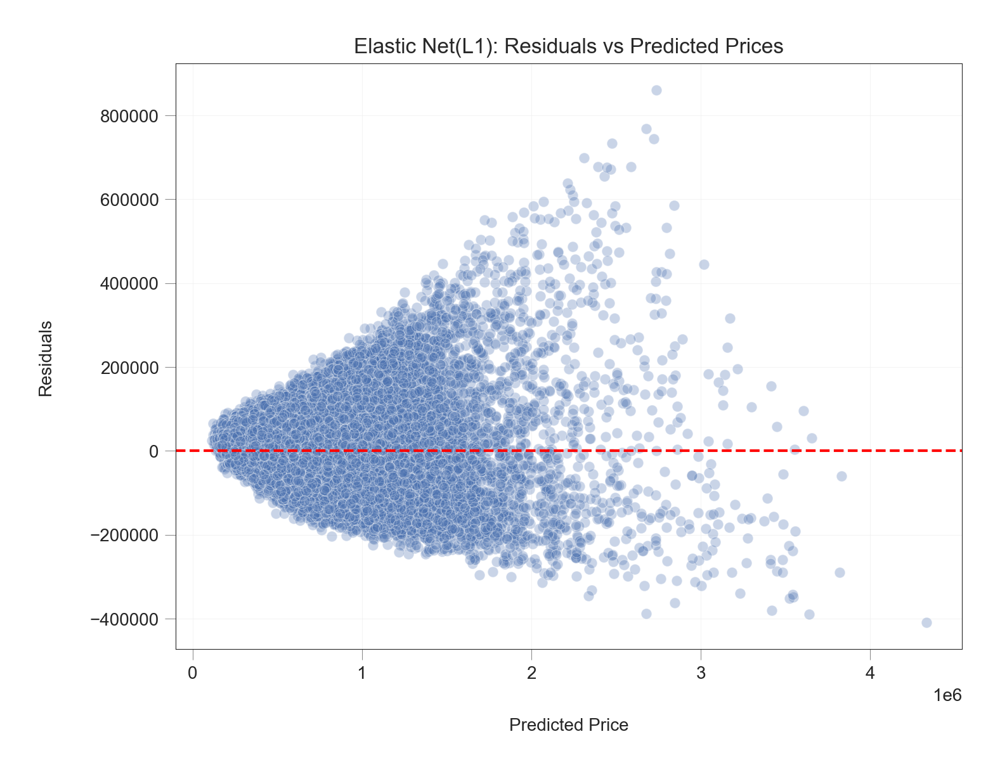

In [ ]:
# residuals = y_test.values.flatten() - y_test_pred

# plt.figure(figsize=(8, 6))
# sns.scatterplot(x=y_test_pred, y=residuals, alpha=0.3)
# plt.axhline(0, linestyle='--', color='red')
# plt.xlabel("Predicted Price")
# plt.ylabel("Residuals")
# plt.title("Elastic Net(L1): Residuals vs Predicted Prices")
# plt.show()

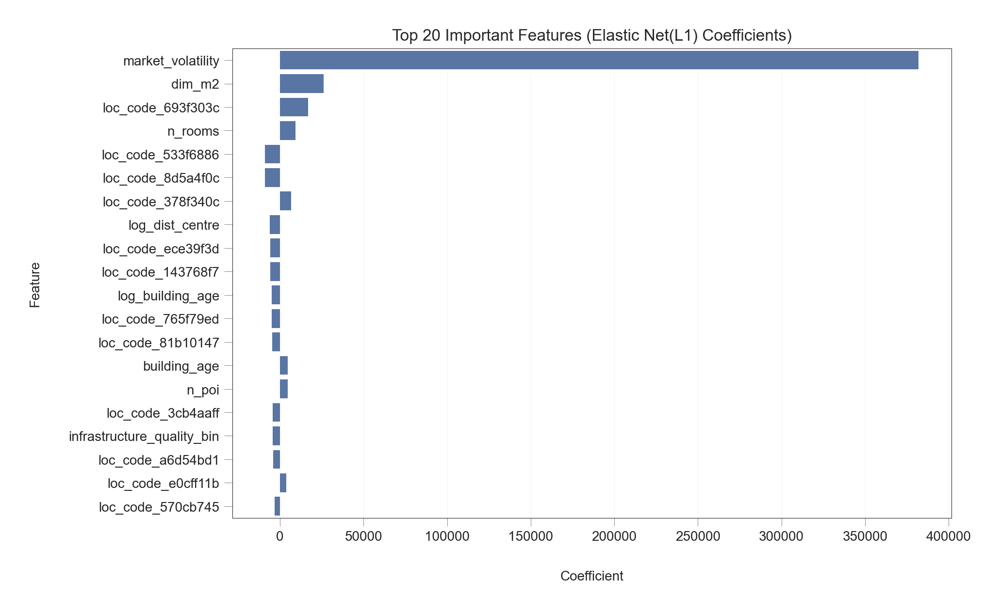

In [ ]:
# coefs = elasticnet_final.coef_.flatten()
# features = X_temp.columns

# coef_df = pd.DataFrame({'Feature': features, 'Coefficient': coefs})
# coef_df['abs'] = coef_df['Coefficient'].abs()
# coef_df_sorted = coef_df.sort_values(by='abs', ascending=False).head(20)

# plt.figure(figsize=(10, 6))
# sns.barplot(x='Coefficient', y='Feature', data=coef_df_sorted)
# plt.title("Top 20 Important Features (Elastic Net(L1) Coefficients)")
# plt.tight_layout()
# plt.show()

The differences of MAE between validation, test, and cross-validated scores are very small, that also supports model doesn't suffer from overfitting or underfitting. The results are very close to the Ridge regression model. market_volatility, dim_m2, and n_rooms are most influential. L1 regularization introduces sparsity: fewer features retained with non-zero coefficients. Location and log-transformed features (log_dist_centre, log_building_age) are still present but more selectively.

##### K-Nearest Neighbors (KNN)

In KNN regression, the algorithm predicts a target value by averaging the nearest neighbors' values. This method could be useful for predicting continuous outcomes such as house prices or stock market trends. KNN assigns a value to a new data point by comparing it to similar points in the training set. The algorithm calculates distances to all existing houses, selecting the K nearest for prediction. The final prediction is typically the average of these neighbors' prices. (https://keylabs.ai/blog/k-nearest-neighbors-knn-real-world-applications, https://garba.org/posts/2022/knn/) 

In [ ]:
# X_sample = X_train.sample(frac=0.7, random_state=42)
# y_sample = y_train.loc[X_sample.index]

# parameter_space = {
#     "n_neighbors": [5, 10, 15, 20],
#     "weights": ["uniform", "distance"],
#     "algorithm": ["ball_tree", "kd_tree", "brute"],   
#     "metric": ["manhattan"]
# }

# clf = GridSearchCV(KNeighborsRegressor(), 
#                    parameter_space, 
#                    cv=5, 
#                    scoring="neg_mean_absolute_error", 
#                    n_jobs=-1)

# clf.fit(X_sample, y_sample)
# print("Best parameters:", clf.best_params_)

Best parameters: {'algorithm': 'ball_tree', 'metric': 'manhattan', 'n_neighbors': 10, 'weights': 'distance'}


We used GridSearchCV with 5-fold cross-validation to optimize the KNN regressor. The model was trained on a 70% sample of the training set. The hyperparameter search covered different values for n_neighbors, weights, algorithm, and used the Manhattan distance metric.These parameters were selected based on minimizing the Mean Absolute Error (MAE) during cross-validation.

In [ ]:
# # Evaluate on the validation set
# knn_model = KNeighborsRegressor(**clf.best_params_)
# knn_model.fit(X_train, y_train)
# y_val_pred = knn_model.predict(X_val)
# val_mae = mean_absolute_error(y_val, y_val_pred)
# print("KNN MAE on validation set:", val_mae)

KNN MAE on validation set: 110024.50971403935


In [ ]:
# knn_final = KNeighborsRegressor(**clf.best_params_)
# knn_final.fit(X_temp, y_temp)

# # Evaluate on test set
# y_test_pred = knn_final.predict(X_test)

# knn_mae = mean_absolute_error(y_test, y_test_pred) 
# knn_mape = mean_absolute_percentage_error(y_test, y_test_pred) 
# knn_r2 = r2_score(y_test, y_test_pred) 
# knn_rmse = root_mean_squared_error(y_test, y_test_pred)
# print("Final KNN Performance on Test Set:")
# print(f"Final KNN MAE on test set:  {knn_mae:,.0f}")
# print(f"Final KNN MAPE on test set: {knn_mape:.2%}")
# print(f"Final KNN R^2 on test set:   {knn_r2:.3f}")
# print(f"Final KNN RMSE on test set: {knn_rmse:,.0f}")

Final KNN Performance on Test Set:
Final KNN MAE on test set:  107,955
Final KNN MAPE on test set: 14.63%
Final KNN R^2 on test set:   0.875
Final KNN RMSE on test set: 151,799


In [ ]:
# kf = KFold(n_splits=10, shuffle=True, random_state=3)
# mae_scores = []

# for train_idx, val_idx in kf.split(X_temp):  
#     X_tr, X_val_k = X_temp.iloc[train_idx], X_temp.iloc[val_idx]
#     y_tr, y_val_k = y_temp.iloc[train_idx], y_temp.iloc[val_idx]
    
#     model =  KNeighborsRegressor(**clf.best_params_)
#     model.fit(X_tr, y_tr)
#     y_val_pred = model.predict(X_val_k)
#     mae = mean_absolute_error(y_val_k, y_val_pred)
#     mae_scores.append(mae)

# print("Mean MAE across folds:", np.mean(mae_scores))
# print("MAE std across folds:", np.std(mae_scores))

Mean MAE across folds: 109143.80848339506
MAE std across folds: 1256.2790806889955


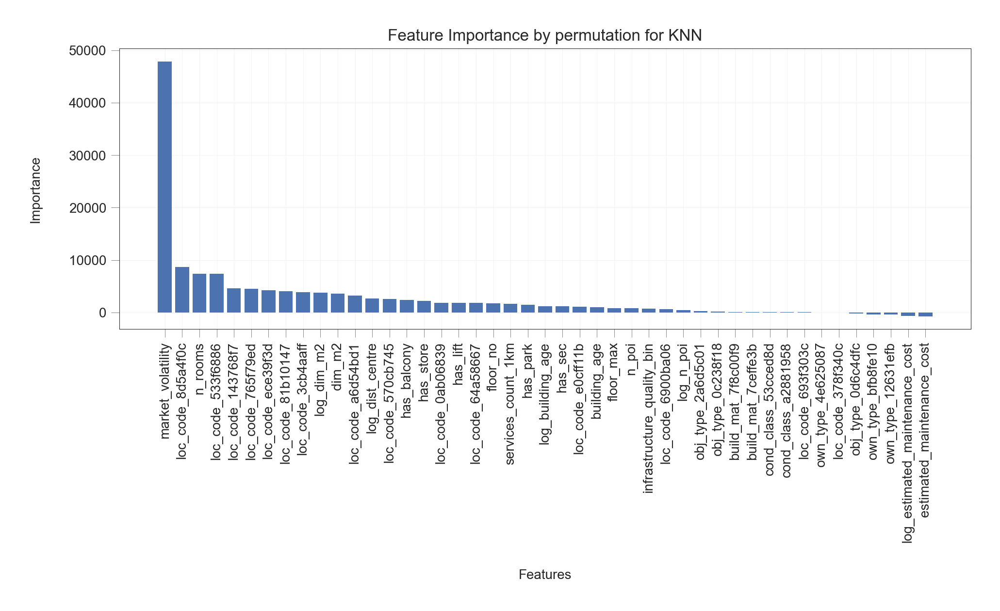

In [ ]:
# # Calculate permutation importances
# X_sample_f_imp = X_test.sample(frac=0.5, random_state=42)
# y_sample_f_imp = y_test.loc[X_sample_f_imp.index]
# result = permutation_importance(knn_final, X_sample_f_imp, y_sample_f_imp, 
#                                 scoring='neg_mean_absolute_error', n_repeats=3, random_state=42, n_jobs = -1)

# importances = result.importances_mean
# indices = np.argsort(importances)[::-1]

# plt.figure(figsize=(10, 6))
# plt.bar(range(X_temp.shape[1]), importances[indices])
# plt.xticks(range(X_temp.shape[1]), X_temp.columns[indices], rotation=90)
# plt.xlabel("Features")
# plt.ylabel("Importance")
# plt.title("Feature Importance by permutation for KNN")
# plt.tight_layout()
# plt.show()

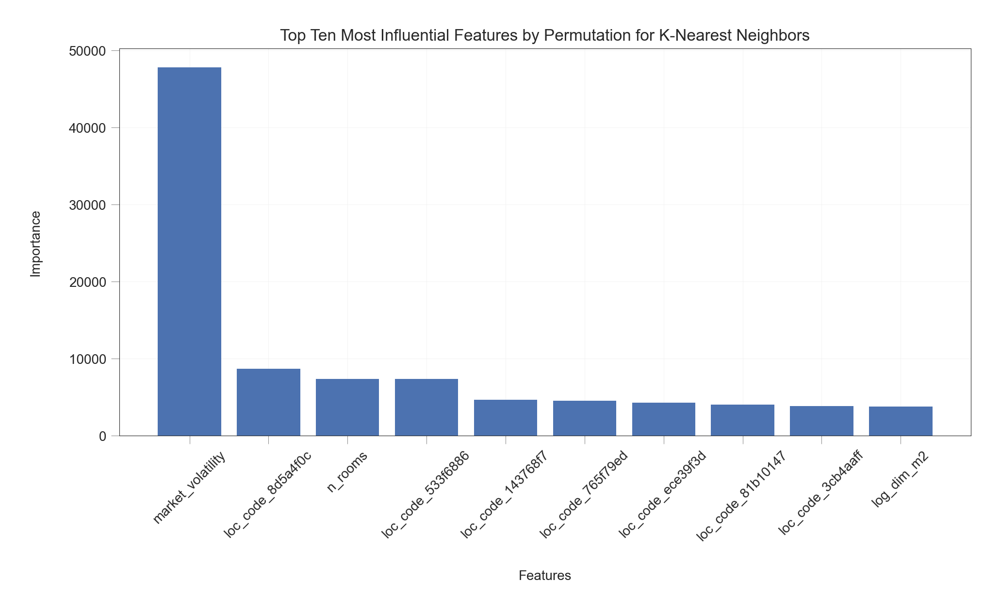

In [ ]:
# # Select only the top ten most influential features
# top_features_indices = indices[:10]
# top_features = X_train.columns[top_features_indices]
# top_importances = importances[top_features_indices]

# plt.figure(figsize=(10, 6))
# plt.bar(range(len(top_features)), top_importances)
# plt.xticks(range(len(top_features)), top_features, rotation=45)
# plt.xlabel("Features")
# plt.ylabel("Importance")
# plt.title("Top Ten Most Influential Features by Permutation for K-Nearest Neighbors")
# plt.tight_layout()
# plt.show()

The KNN model generalizes well, achieving high predictive accuracy with an R^2 of 0.875, suggesting it explains 87.5% of the variance in the target variable. The relatively low MAPE confirms good relative error performance. Mean MAE across folds and MAE standard deviation indicates relatively stable performance across folds. Regarding the top features, again market_volatility, followed by loc_code_8d5a4f0c, n_rooms, and dim_m2. Results confirm that a few these key variables dominate decision-making.

##### Support Vector Regression
SVR is useful for house price prediction because it focuses on fitting a function that predicts within a certain error margin, while being robust to outliers and nonlinear relationships. SVR helps capture complex patterns in housing data and provides stable, margin-based predictions. (https://soumenatta.medium.com/predicting-house-prices-with-support-vector-regression-in-python-46ce87686eb7)

In [ ]:
# X_sample = X_train.sample(frac=0.7, random_state=3)
# y_sample = y_train.loc[X_sample.index]

# parameter_space = \
#     {
#         "kernel": [ "linear", "rbf"],
#         "gamma":[1e-3, 1e-2, 1e-1],
#         "C": [1, 10, 100],
#         "epsilon": [0.1, 0.2, 0.5]
#     }

# clf = RandomizedSearchCV(SVR(), parameter_space, n_iter=10, cv=3, n_jobs=-1,
#                   random_state=3, scoring="neg_mean_absolute_error")

# clf.fit(X_sample, y_sample)
# print("Best parameters:")
# print(clf.best_params_)

Best parameters:
{'kernel': 'linear', 'gamma': 0.001, 'epsilon': 0.5, 'C': 1}


In [ ]:
# # Evaluate on the validation set
# svr_model = SVR(**clf.best_params_)
# svr_model.fit(X_train, y_train.values.ravel())  

# y_val_pred = svr_model.predict(X_val)
# val_mae = mean_absolute_error(y_val, y_val_pred)
# print("SVR MAE on validation set:", val_mae)

SVR MAE on validation set: 187667.78703914586


In [ ]:
# svr_final = SVR(**clf.best_params_)
# svr_final.fit(X_temp, y_temp.values.ravel())

# # Evaluate on the test set
# y_test_pred = svr_final.predict(X_test)

# svr_mae = mean_absolute_error(y_test, y_test_pred) 
# svr_mape = mean_absolute_percentage_error(y_test, y_test_pred) 
# svr_r2 = r2_score(y_test, y_test_pred) 
# svr_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred)) 

# print("Final SVR Performance on Test Set:")
# print(f"Final SVR MAE on test set:  {svr_mae:,.0f}")
# print(f"Final SVR MAPE on test set: {svr_mape:.2%}")
# print(f"Final SVR R^2 on test set:   {svr_r2:.3f}")
# print(f"Final SVR RMSE on test set: {svr_rmse:,.0f}")

Final SVR Performance on Test Set:
Final SVR MAE on test set:  172,661
Final SVR MAPE on test set: 21.91%
Final SVR R^2 on test set:   0.589
Final SVR RMSE on test set: 274,959


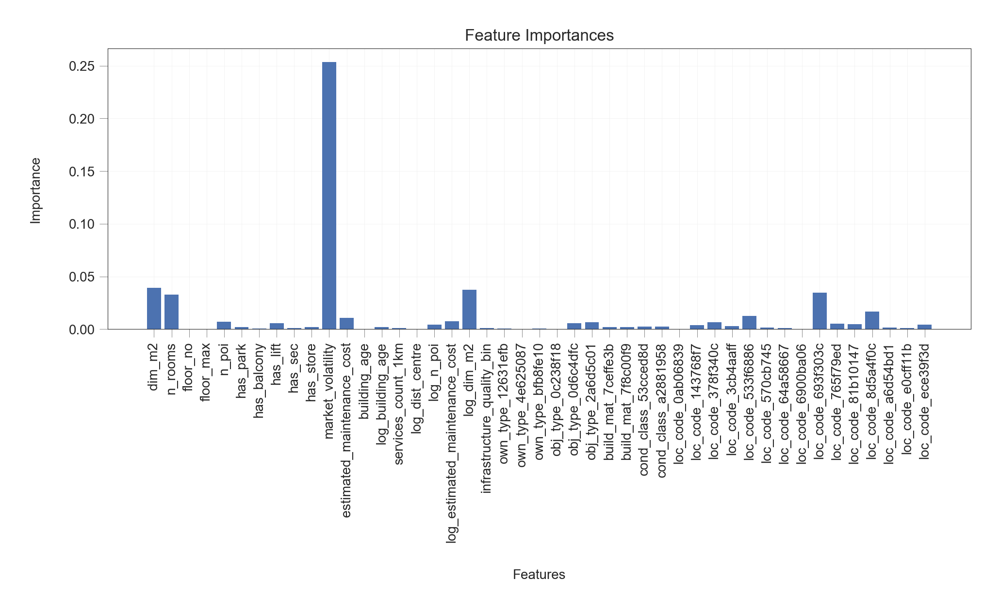

In [ ]:
# perm_importance = PermutationImportance(svr_final, random_state=42, n_iter=3).fit(X_sample_f_imp, y_sample_f_imp) # use sample here as well

# feature_names = X_test.columns.tolist()

# plt.figure(figsize=(10, 6))
# plt.bar(range(len(perm_importance.feature_importances_)), perm_importance.feature_importances_)
# plt.xticks(range(len(perm_importance.feature_importances_)), feature_names, rotation=90)
# plt.xlabel('Features')
# plt.ylabel('Importance')
# plt.title('Feature Importances')
# plt.tight_layout()
# plt.show()

##### XGBoost

Finally, we will check XGBoost model. XGBoost regression, a powerful gradient-boosting algorithm known for its efficiency and accuracy in handling structured data. XGBoost's ability to handle missing values, feature importance analysis, and ensemble learning makes it a good choice for this prediction task. Several studies proved, that XGBoost is the best choice for housing price predictions. The findings revealed that the house price prediction model based on XGBoost showed the highest performance by generating the lowest MAE and RMSE, and the closest adjusted R^2 value to one, consistently outperformed other ML models. So, let's also test this hypothesis. (https://github.com/pracheeeeez/House_Price_Prediction, https://thesai.org/Downloads/Volume12No12/Paper_91-Advanced_Machine_Learning_Algorithms.pdf, https://www.mdpi.com/2813-2203/3/1/3, https://www.union.ai/docs/flyte/tutorials/model-training/house-price-prediction/house-price-predictor/)

In [ ]:
parameter_space = \
    {
        "max_depth": [4, 5, 6],
        "learning_rate": [0.005, 0.009, 0.01],
        "n_estimators": [700, 1000, 2500],
        "booster": ["gbtree",],
        "gamma": [0, 5, 15],
        "subsample": [0.5, 0.7],
        "colsample_bytree": [0.5, 0.7],
        "colsample_bylevel": [0.5, 0.7,],
        "reg_alpha": [0, 1, 10],
        "reg_lambda": [1, 3, 10],
    }

clf = RandomizedSearchCV(XGBRegressor(random_state=3,tree_method="hist", verbosity=1), 
                         parameter_space, cv=3, n_jobs=4,
                         scoring="neg_mean_absolute_error", 
                         random_state=3, n_iter=10)

clf.fit(X_train, y_train)
print("Best parameters:")
print(clf.best_params_)

Best parameters:
{'subsample': 0.5, 'reg_lambda': 3, 'reg_alpha': 10, 'n_estimators': 2500, 'max_depth': 6, 'learning_rate': 0.01, 'gamma': 5, 'colsample_bytree': 0.5, 'colsample_bylevel': 0.5, 'booster': 'gbtree'}


To optimize the XGBoost model for apartment price prediction, a randomized grid search was performed over a carefully selected parameter space using 3-fold cross-validation and neg_mean_absolute_error as the evaluation metric. We can see that from the suggested parameters, small learning rate (0.01) compensates with with quite large number of trees (2500).Max depth of 6 limits the depth of each tree, controlling model complexity and helping prevent overfitting while capturing meaningful patterns in the data. Colsample by tree and by level 0.5 control the fraction of features used per tree and per tree level, respectively. Setting both to 0.5 introduces randomness into the model, improving generalization and reducing the risk of overfitting. Gamma equals 5 prevents unnecessary splits, however could increases biases slightly. reg_alpha (L1 regularization) equals 10 encourages sparsity by driving less important feature weights to zero. reg_lambda (L2 regularization) equals 3 penalizes large feature weights, promoting smoother and more stable model estimates.

In [184]:
# Evaluate on the validation set
xgbreg_model = XGBRegressor(**clf.best_params_)
xgbreg_model.fit(X_train, y_train.values)  

y_val_pred = xgbreg_model.predict(X_val)
val_mae = mean_absolute_error(y_val, y_val_pred)
print("XGBRegressor MAE on validation set:", val_mae)

XGBRegressor MAE on validation set: 68531.21875


In [185]:
xgbreg_final = XGBRegressor(**clf.best_params_)
xgbreg_final.fit(X_temp, y_temp.values)

# Evaluate on the test set
y_test_pred = xgbreg_final.predict(X_test)

xgbreg_mae = mean_absolute_error(y_test, y_test_pred) 
xgbreg_mape = mean_absolute_percentage_error(y_test, y_test_pred) 
xgbreg_r2 = r2_score(y_test, y_test_pred) 
xgbreg_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred)) 

print("Final XGBRegressor Performance on Test Set:")
print(f"Final XGBRegressor MAE on test set:  {xgbreg_mae:,.0f}")
print(f"Final XGBRegressor MAPE on test set: {xgbreg_mape:.2%}")
print(f"Final XGBRegressor R^2 on test set:   {xgbreg_r2:.3f}")
print(f"Final XGBRegressor RMSE on test set: {xgbreg_rmse:,.0f}")

Final XGBRegressor Performance on Test Set:
Final XGBRegressor MAE on test set:  68,617
Final XGBRegressor MAPE on test set: 8.83%
Final XGBRegressor R^2 on test set:   0.952
Final XGBRegressor RMSE on test set: 93,966


<Axes: title={'center': 'Feature importance'}, xlabel='Importance score', ylabel='Features'>

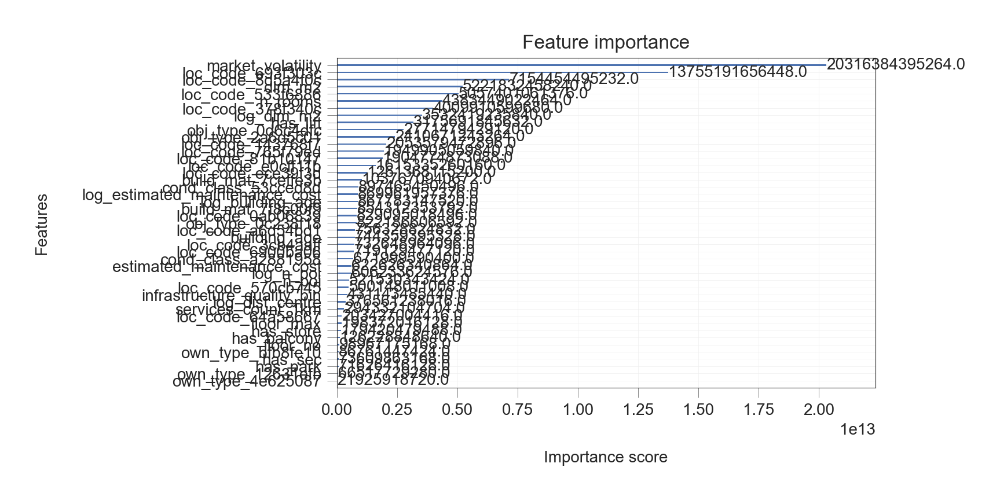

In [ ]:
xgbreg_final.get_booster().get_score(importance_type='gain')
xgb.plot_importance(xgbreg_final, importance_type='gain')

Market Volatility again ranks as a the most influential feature, with an extremely high gain, followed by multiple loc_code_* and log_* features. Tree-based importance (gain) emphasizes features that most reduce error at split points.

##### Analysis and comparison
Now let's compare the result from the different models and plot them for the better representativity. 

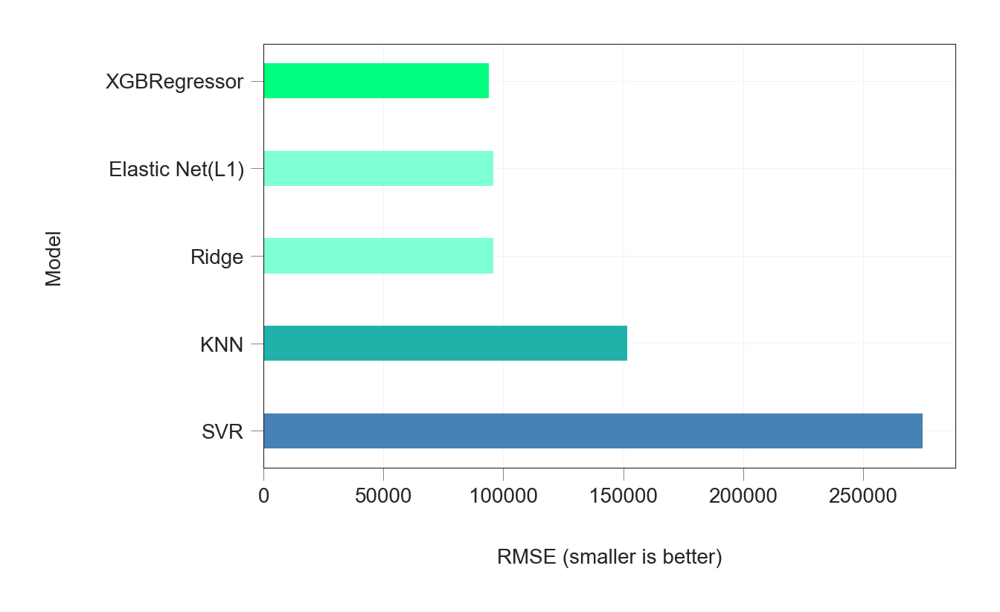

In [ ]:
# RMSE
# x = ['SVR', 'KNN', 'Ridge', 'Elastic Net(L1)', 'XGBRegressor']
# y = [svr_rmse, knn_rmse, ridge_test_rmse, elasticnet_rmse, xgbreg_rmse]
# colors = ["steelblue", "lightseagreen", "aquamarine", "aquamarine", "springgreen"]
# fig, ax = plt.subplots()
# plt.barh(y=range(len(x)), tick_label=x, width=y, height=0.4, color=colors);
# ax.set(xlabel="RMSE (smaller is better)", ylabel="Model");

XGBoost leads with the lowest RMSE, suggesting it avoids large outliers better than others. Ridge and Elastic Net perform similarly, confirming their stability to multicollinearity. KNN and SVR perform poorly, with SVR especially penalized due to a few large prediction deviations.

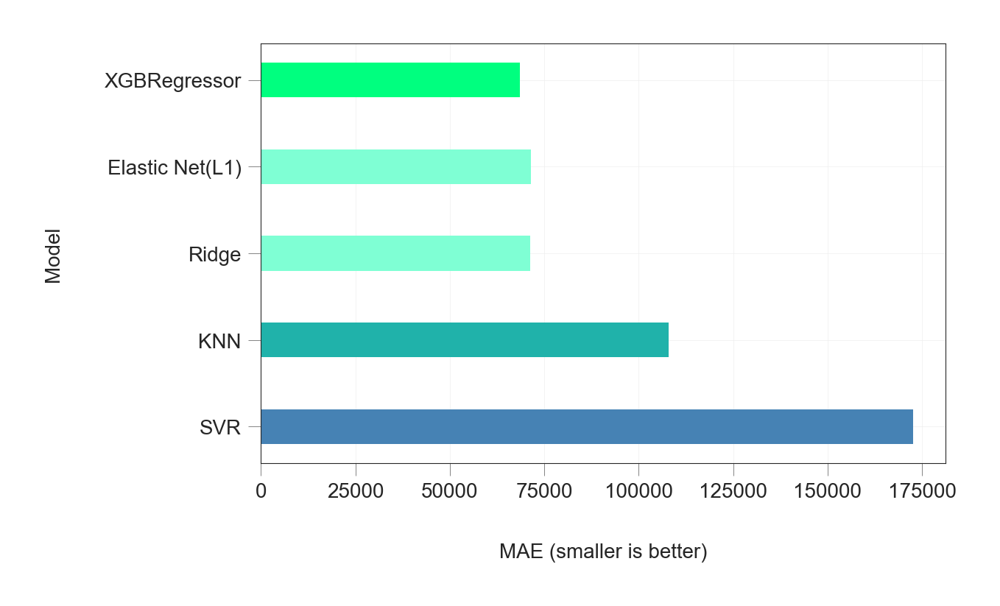

In [ ]:
# # MAE
# x = ['SVR', 'KNN', 'Ridge', 'Elastic Net(L1)', 'XGBRegressor']
# y = [svr_mae, knn_mae, ridge_test_mae, elasticnet_mae, xgbreg_mae]
# colors = ["steelblue", "lightseagreen", "aquamarine", "aquamarine", "springgreen"]
# fig, ax = plt.subplots()
# plt.barh(y=range(len(x)), tick_label=x, width=y, height=0.4, color=colors);
# ax.set(xlabel="MAE (smaller is better)", ylabel="Model");

Again, XGBoost clearly achieves the lowest MAE, meaning its predictions are on average closest to the actual apartment prices. Elastic Net and Ridge perform similarly and competitively. KNN and SVR lag significantly, especially SVR, which produces overly large errors.

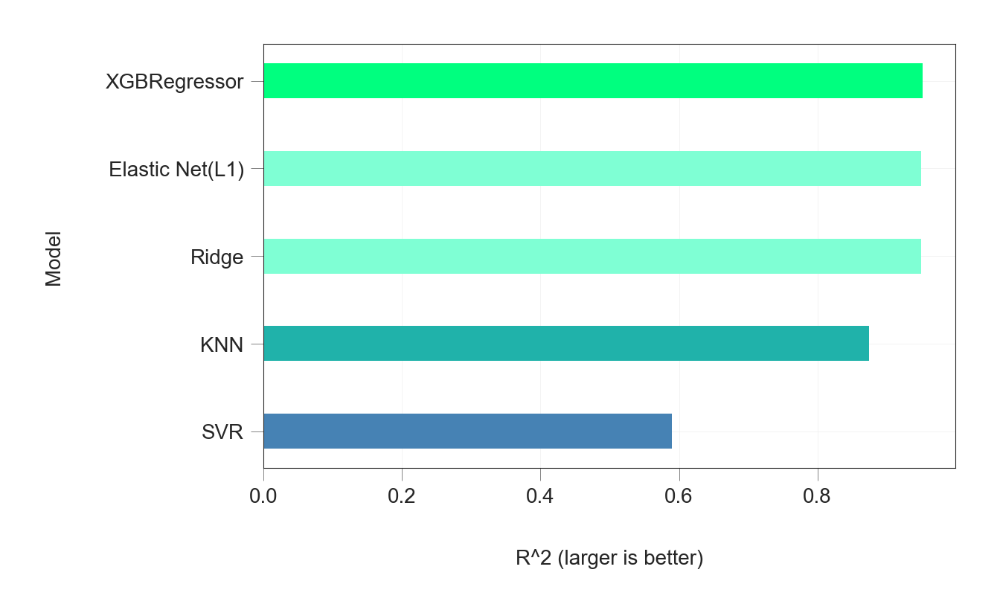

In [ ]:
# # R^2
# x = ['SVR', 'KNN', 'Ridge', 'Elastic Net(L1)', 'XGBRegressor']
# y = [svr_r2, knn_r2, ridge_test_r2, elasticnet_r2, xgbreg_r2]
# colors = ["steelblue", "lightseagreen", "aquamarine", "aquamarine", "springgreen"]
# fig, ax = plt.subplots()
# plt.barh(y=range(len(x)), tick_label=x, width=y, height=0.4, color=colors);
# ax.set(xlabel="R^2 (larger is better)", ylabel="Model");

XGBoost, Elastic Net and Ridge achieves the highest R^2 (around 0.952), meaning these three models explain the most variance in apartment prices. KNN and SVR show considerably lower R^2, implying they fail to generalize well on unseen data.

Based on the presented comparison, XGBoost is the best model across all metrics. Its ability to capture nonlinear patterns, interactions, and  handling of high-cardinality features makes it suited for apartments prediction and confirms the results of the above studies. Therefore, we will use XGBoost model for our price prediction. 

##### Predict prices on the test data set

In [161]:
test = pd.read_csv("data/appartments_test.csv")

In [ ]:
### Data cleaning 

# Impute build_mat
test['build_mat'] = test.apply(impute_build_mat, axis=1)   
build_mat_by_obj = test.groupby('obj_type')['build_mat'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else np.nan)
test['build_mat'] = test.apply(
    lambda row: build_mat_by_obj[row['obj_type']] if pd.isna(row['build_mat']) and row['obj_type'] in build_mat_by_obj else row['build_mat'],
    axis=1)

# Impute cond_class
test['cond_class'] = test.apply(impute_cond_class, axis=1)
cond_class_by_build = test.groupby('build_mat')['cond_class'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else np.nan)
test['cond_class'] = test.apply(
    lambda row: cond_class_by_build[row['build_mat']] if pd.isna(row['cond_class']) and row['build_mat'] in cond_class_by_build else row['cond_class'],
    axis=1)

# Fill in build_mat column with mode value by build_mat column
test['build_mat'] = test['build_mat'].fillna(test['build_mat'].mode()[0])

# Fill in cond_class column with mode value by cond_class column
test['cond_class'] = test['cond_class'].fillna(test['cond_class'].mode()[0])

# Impute obj_type 
test['obj_type'] = test.apply(impute_obj_type, axis=1) 
   
# Impute floor_no with median by obj_type grouped values 
median_floor_by_obj = test.groupby('obj_type')['floor_no'].median()
test['floor_no'] = test.apply(
    lambda row: median_floor_by_obj[row['obj_type']] if pd.isna(row['floor_no']) and row['obj_type'] in median_floor_by_obj else row['floor_no'],
    axis=1)

# Impute year_built with median by build_mat grouped values 
median_year_by_mat = test.groupby(['build_mat'])['year_built'].median()
test['year_built'] = test.apply(
    lambda row: median_year_by_mat[row['build_mat']]
    if pd.isna(row['year_built']) and pd.notna(row['build_mat']) and row['build_mat'] in median_year_by_mat
    else row['year_built'],
    axis=1)

# Predict missing values for infrastructure_quality
ifrastructure_quality__data = test[test['infrastructure_quality'].notna()]
X = ifrastructure_quality__data[['year_built']]  
y = ifrastructure_quality__data['infrastructure_quality']
model = LinearRegression()
model.fit(X, y)
missing_infr_quality = test['infrastructure_quality'].isna()
test.loc[missing_infr_quality, 'infrastructure_quality'] = model.predict(test.loc[missing_infr_quality, ['year_built']])

# Impute floor_max
test['floor_max'] = test.apply(impute_floor_max, axis=1)
invalid_floors  = test[test['floor_no'] > test['floor_max']]
test.loc[test['floor_no'] > test['floor_max'], 'floor_max'] = test['floor_no'] + 1 # apply an rough adjustment, that it would be floor_no + 1 = floor_max
invalid_floors  = test[test['floor_no'] > test['floor_max']]

# Impute has_lift
test['has_lift'] = test.apply(impute_has_lift, axis=1)

# Impute distances grouped by local code with median
group_medians = test.groupby('loc_code')[
    ['dist_uni', 'dist_clinic', 'dist_rest', 'dist_pharma', 
     'dist_post', 'dist_kind', 'dist_sch']
].median()

for col in ['dist_uni', 'dist_clinic', 'dist_rest', 'dist_pharma', 
            'dist_post', 'dist_kind', 'dist_sch']:
    
    test[col] = test.apply(
        lambda row: group_medians.loc[row['loc_code'], col] 
        if pd.isna(row[col]) and row['loc_code'] in group_medians.index 
        else row[col], axis=1)
    
    test[col] = test[col].fillna(test[col].median())

#Converting categorical columns to binary
columns_to_change = ['has_park', 'has_balcony', 'has_lift','has_sec','has_store']
maping = {'yes': 1, 'no': 0}
test[columns_to_change] = test[columns_to_change].applymap(lambda x: maping.get(x, x))

#Converting year_built to int and src_month to date 
test['year_built'] = test['year_built'].astype('Int64')
test['src_month'] = pd.to_datetime(test['src_month'], format='%Y-%m')

In [ ]:
### Create different function for test since for the train we removed 'unit_id' variable. This variable should be kept for the test set.

def feature_engineering_test(dataset):
    dt = dataset
    
    # Calculate building age
    current_year = int(datetime.today().strftime('%Y'))
    dt['building_age'] = current_year - dt['year_built'] 
    dt.drop(columns=['year_built'], inplace=True)

    # Log transform of building_age
    dt['log_building_age'] = np.log1p(dt['building_age'])

    # Count number of services within 1 km
    dist_cols = ['dist_sch', 'dist_clinic', 'dist_post', 'dist_kind', 'dist_rest', 'dist_uni', 'dist_pharma']
    dt['services_count_1km'] = (dt[dist_cols] < 1).sum(axis=1)    
    dt.drop(columns=['dist_sch', 'dist_clinic', 'dist_post', 'dist_kind', 'dist_rest', 'dist_uni', 'dist_pharma'], inplace=True)
    
    # Log transform dist_centre
    dt['log_dist_centre'] = np.log1p(dt['dist_centre'])
    dt.drop(columns=['dist_centre'], inplace=True)

    # Log transform of n_poi
    dt['log_n_poi'] = np.log1p(dt['n_poi'])

    # Log transform of estimated_maintenance_cost
    dt['log_estimated_maintenance_cost'] = np.log1p(dt['estimated_maintenance_cost'])

    # Log transform of dim_m2
    dt['log_dim_m2'] = np.log1p(dt['dim_m2'])

    # Quantile binning of infrastructure_quality
    try:
        dt['infrastructure_quality_bin'] = pd.qcut(dt['infrastructure_quality'], q=4, labels=False, duplicates='drop')
    except ValueError:
        dt['infrastructure_quality_bin'] = np.nan
    dt.drop(columns=['infrastructure_quality'], inplace=True)    

    # One-hot encode for own_type,obj_type, build_mat, cond_class and loc_code
    onehot_cols = ['own_type','obj_type', 'build_mat', 'cond_class', 'loc_code']
    dt = pd.get_dummies(dt, columns=onehot_cols, prefix=onehot_cols, drop_first=False)    

    # Drop variables 
    dt.drop(columns=['src_month','green_space_ratio', 'neighborhood_crime_rate', 'popularity_index', 'global_economic_index'], inplace=True)

    return dt

In [ ]:
# Feature engineering, scaling and modeling 

test = feature_engineering_test(test)
observation_ids = test['unit_id']
X_final_test = test.drop(columns=['unit_id'], errors='ignore')

# Apply the same scaler used on training data
X_final_test_scaled = scaler.transform(X_final_test) 

# Predict using trained XGBoost regressor model
final_predictions = xgbreg_final.predict(X_final_test_scaled)

# Create the dataframr with predcited prices
submission_df = pd.DataFrame({
    'unit_id': observation_ids,
    'price_z': final_predictions
})
submission_df.to_csv("xgbreg_predictions.csv", index=False)

In [167]:
prediction = pd.read_csv("xgbreg_predictions.csv")
prediction.columns

Index(['unit_id', 'price_z'], dtype='object')

In [ ]:
# Check the borders of the prices from train data set and predicted prices
print("Trained price range:", y_test_pred.min(), "-", y_test_pred.max())
print("Predicted price range:", final_predictions.min(), "-", final_predictions.max())

Trained price range: 165383.23 - 3328528.8
Predicted price range: 165480.1 - 3302441.8


The predicted apartment prices generated by the XGBoost model are well-aligned with the range observed in the training data. This alignment confirms that the model doesn't extrapolate beyond the bounds of the training data. The absence of extreme outliers or implausible predictions suggests that the model avoids both overfitting and underfitting.

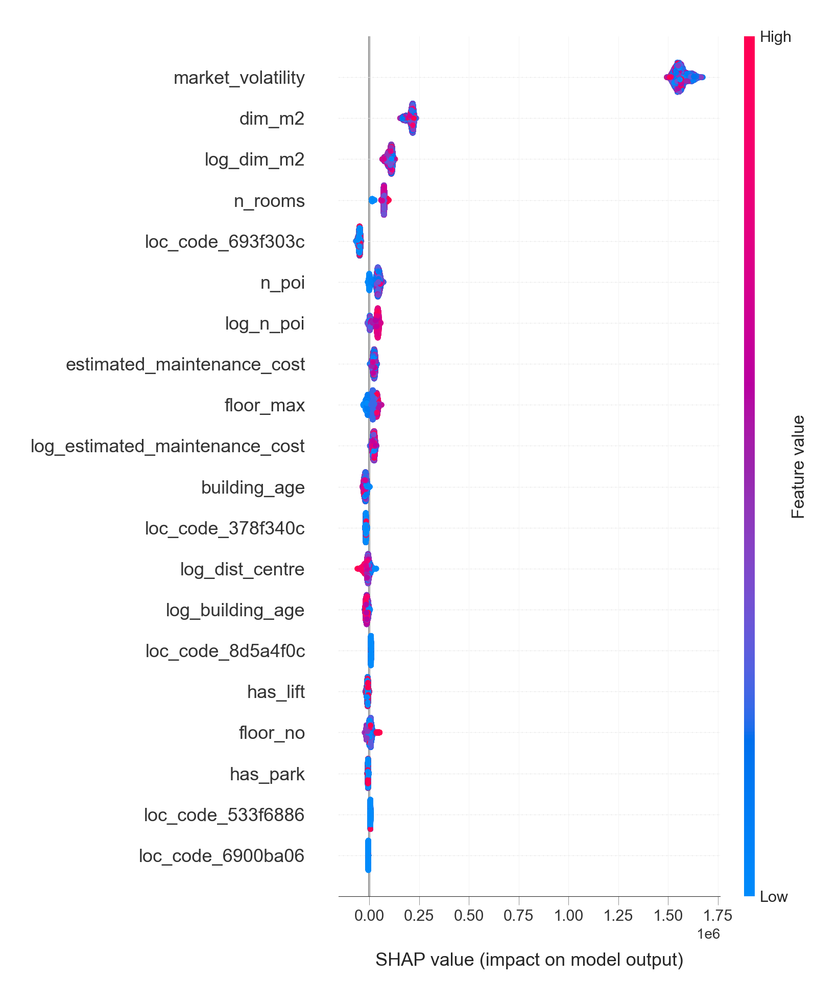

In [ ]:
explainer = shap.TreeExplainer(xgbreg_final)
shap_values = explainer.shap_values(X_final_test)

shap.summary_plot(shap_values, X_final_test)

From the SHAP plot we can see that the most influential features include market_volatility, dim_m2, log_dim_m2, n_rooms, and several location encodings (loc_code_*). Higher values of variables such as dim_m2, n_rooms, and market_volatility consistently contribute to increased price predictions, which aligns with domain knowledge and market expectations. The presence and importance of log-transformed variables further justify their inclusion during feature engineering, as they capture nonlinear patterns effectively. (https://shap.readthedocs.io/en/latest/generated/shap.plots.scatter.html)

Text(0.5, 1.0, 'Distribution of the predicted price_z (test set)')

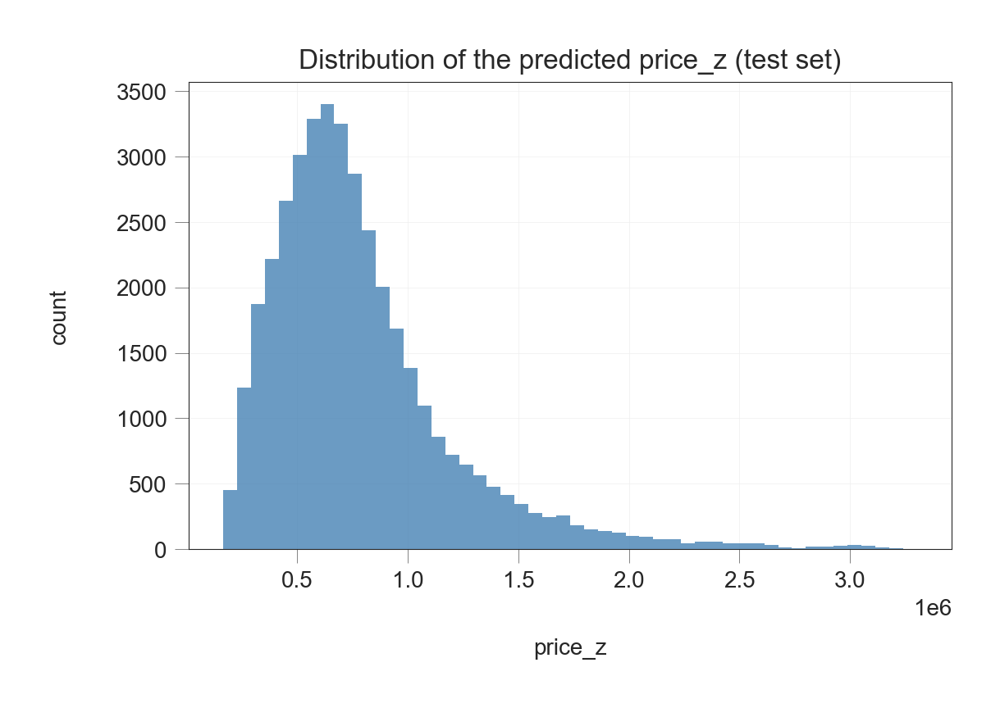

In [208]:
sns.distplot(prediction['price_z'], kde=False, 
             color='steelblue', hist_kws={"alpha": 0.8})
plt.ylabel("count")
plt.title("Distribution of the predicted price_z (test set)")

Text(0.5, 1.0, 'Distribution of the predicted price_z (train set)')

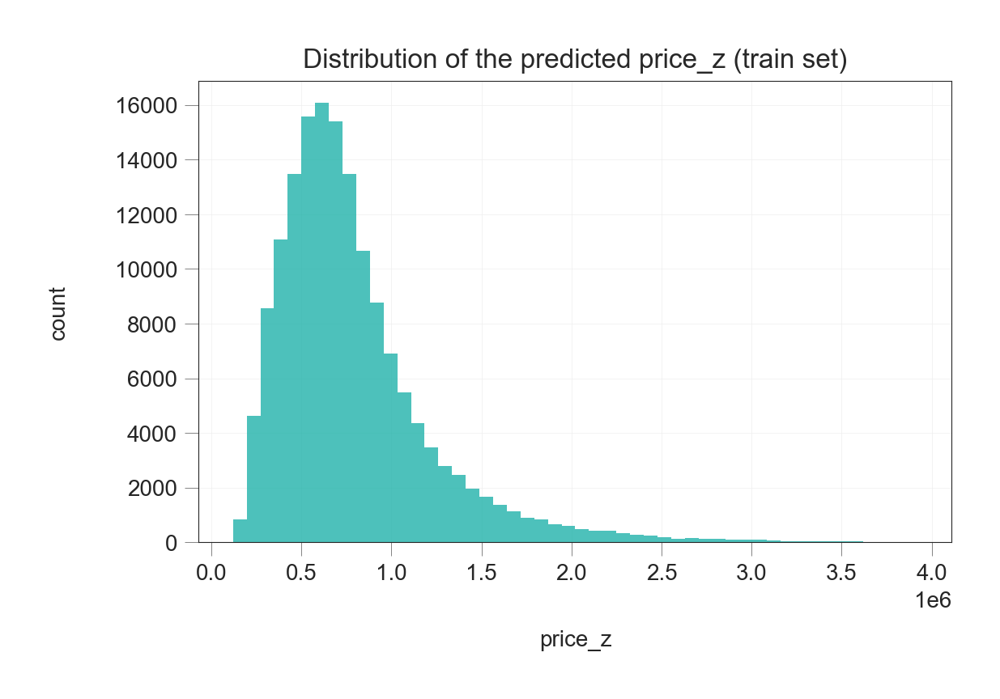

In [209]:
# Distribution of the price_z in the train data set 
sns.distplot(train['price_z'], kde=False, 
             color='lightseagreen', hist_kws={"alpha": 0.8})
plt.ylabel("count")
plt.title("Distribution of the predicted price_z (train set)")

The predicted prices in the training set follow a right-skewed distribution, with a peak between 500,000 and 800,000 and a long tail extending into the multi-million range. The test set predictions exhibit a nearly identical distribution to that of the training set, peaking around 600,000. This visual symmetry confirms that the model has generalized well to unseen data and that no significant distribution shift or data leakage has occurred.

The XGBoost model produces realistic and reliable apartment price predictions. The predictions are statistically consistent with the training data and maintain expected market behavior. The model demonstrates a strong ability to generalize, and the SHAP plot confirms that the most impactful features are intuitive and interpretable. 